In [1]:
import os
import sys
import gc
import io
import math
import random
import time
import datetime
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use("seaborn-v0_8")
sns.set_context("notebook")

from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    KFold,
    cross_val_score,
    GridSearchCV,
    RandomizedSearchCV
)

from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    RobustScaler,
    LabelEncoder,
    OneHotEncoder
)

from sklearn.impute import SimpleImputer

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import *

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import *

from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB

from sklearn.neural_network import MLPRegressor
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    log_loss,
    confusion_matrix,
    classification_report,
    mean_squared_error,
    mean_absolute_error,
    r2_score
)

from sklearn.feature_selection import (
    SelectKBest,
    chi2,
    f_classif,
    mutual_info_classif
)

from sklearn.model_selection import (
    train_test_split
)

from sklearn import datasets

import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier, CatBoostRegressor

from scipy import stats
from scipy.stats import skew, kurtosis

from tqdm import tqdm
from collections import Counter


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/house-prices-advanced-regression-techniques/sample_submission.csv
/kaggle/input/house-prices-advanced-regression-techniques/data_description.txt
/kaggle/input/house-prices-advanced-regression-techniques/train.csv
/kaggle/input/house-prices-advanced-regression-techniques/test.csv


In [2]:
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')

In [4]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
result = df.duplicated().sum()
if result > 0: 
    df = df.drop_duplicates()

In [7]:
drop_cols = ['Id', 'Alley', 'MasVnrType', 'PoolQC', 'Fence', 'MiscFeature', 'FireplaceQu']
df = df.drop(columns=drop_cols)

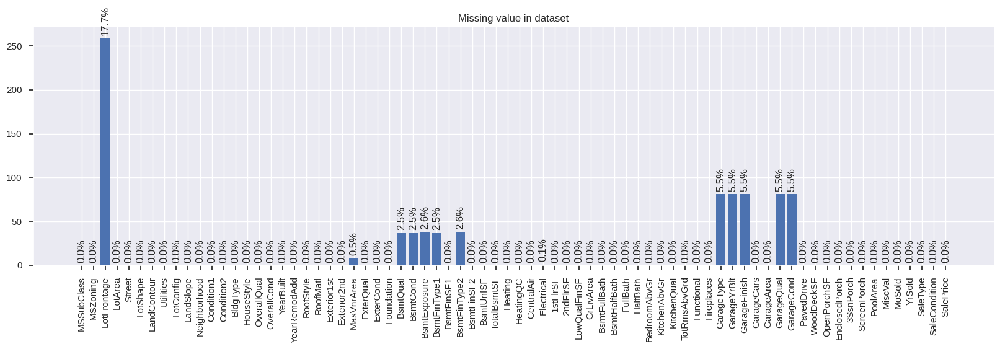

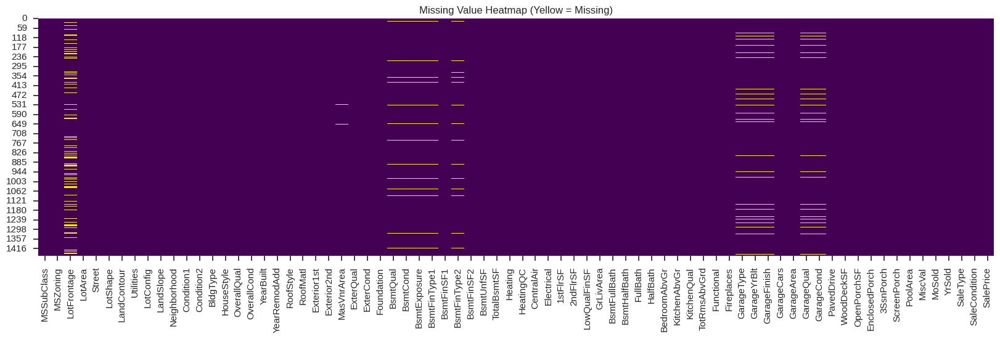

In [8]:
result = df.isnull().sum()
total = df.shape[0]
fig, ax = plt.subplots(1, 1, figsize=(20, 5))
bars = ax.bar(result.index, result.values)
labels = [f'{(v/total)*100:.1f}%' for v in result.values]
ax.bar_label(bars, labels=labels, padding=3, rotation=90)
ax.tick_params("x", rotation=90)
ax.set_title('Missing value in dataset')

plt.figure(figsize=(20, 5))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Value Heatmap (Yellow = Missing)")
plt.show()

In [9]:
cat_cols = [col for col in df.columns if df[col].dtype == 'object']
num_cols = [col for col in df.columns if df[col].dtype == 'float64']

cat_cols += ['OverallQual', 'OverallCond']
num_cols += [col for col in df.columns if df[col].dtype == 'int64' and col not in cat_cols]

In [10]:
print(len(cat_cols))
print(len(num_cols))

39
35


In [11]:
for col in cat_cols:
    df[col] = df[col].astype("category")
for col in num_cols:
    df[col] = df[col].astype("float64")

In [12]:
def analyze_numerical(df, col):
    print(f"--- Analysis for: {col} ---")

    desc = df[col].describe()
    skew = df[col].skew()
    kurt = df[col].kurtosis()

    Q1, Q3 = df[col].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_count = df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0]

    print(f"Mean: {desc['mean']:.2f} | Median: {desc['50%']:.2f}")
    print(f"Skewness: {skew:.2f} | Kurtosis: {kurt:.2f}")
    print(f"Outliers detected: {outliers_count} (Bounds: {lower_bound:.2f} to {upper_bound:.2f})\n")

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    sns.histplot(df[col], kde=True, ax=axes[0], color='royalblue')
    axes[0].set_title('Histogram & KDE')

    sns.violinplot(x=df[col], ax=axes[1], color='lightgray', inner=None)
    sns.boxplot(x=df[col], ax=axes[1], width=0.3, color='skyblue', showmeans=True)
    axes[1].set_title('Box & Violin Plot')

    stats.probplot(df[col], dist="norm", plot=axes[2])
    axes[2].set_title('Probability (Q-Q) Plot')

    plt.tight_layout()
    plt.show()

def analyze_categorical(df, col, rare_threshold=5):
    print(f"--- Categorical Analysis: {col} ---")

    series = df[col].astype("category")

    counts = series.value_counts()
    percent = series.value_counts(normalize=True) * 100


    summary = pd.DataFrame({
        "Count": counts,
        "Percentage": percent
    })

    cardinality = series.nunique()
    dominant_cat = percent.idxmax()
    dominant_pct = percent.max()

    print(f"Cardinality (unique): {cardinality}")
    print(f"Dominant category: {dominant_cat} ({dominant_pct:.1f}%)")

    rare_cats = percent[percent < rare_threshold].index.tolist()
    if rare_cats:
        print(f"Rare categories (<{rare_threshold}%): {rare_cats}")
    else:
        print("No rare categories")

    plt.figure(figsize=(10, 4))

    ax = sns.barplot(
        x=summary.index,
        y=summary["Count"],
        hue=summary.index,
        palette="viridis",
        legend=False,
        order=summary.index,
    )

    for i, (cnt, pct) in enumerate(zip(counts, percent)):
        ax.text(i, cnt, f"{pct:.1f}%", ha="center", va="bottom", fontsize=9)

    plt.title(f"Frequency Distribution: {col}")
    plt.xticks(rotation=45)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

    print("-" * 40 + "\n")

--- Analysis for: LotFrontage ---
Mean: 70.05 | Median: 69.00
Skewness: 2.16 | Kurtosis: 17.45
Outliers detected: 88 (Bounds: 27.50 to 111.50)



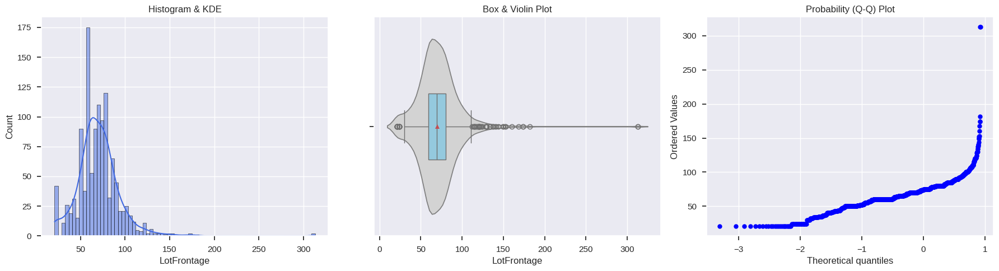

--- Analysis for: MasVnrArea ---
Mean: 103.69 | Median: 0.00
Skewness: 2.67 | Kurtosis: 10.08
Outliers detected: 96 (Bounds: -249.00 to 415.00)



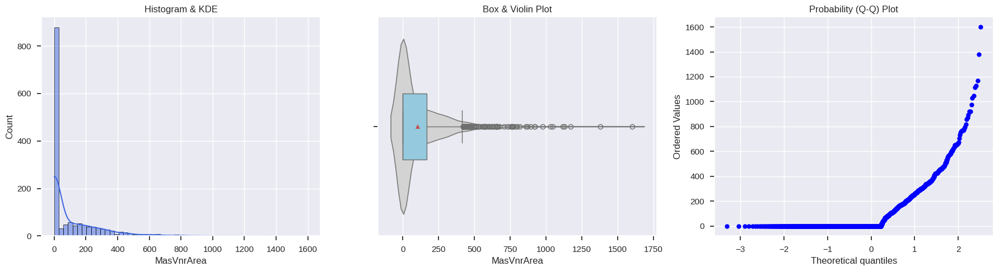

--- Analysis for: GarageYrBlt ---
Mean: 1978.51 | Median: 1980.00
Skewness: -0.65 | Kurtosis: -0.42
Outliers detected: 0 (Bounds: 1899.50 to 2063.50)



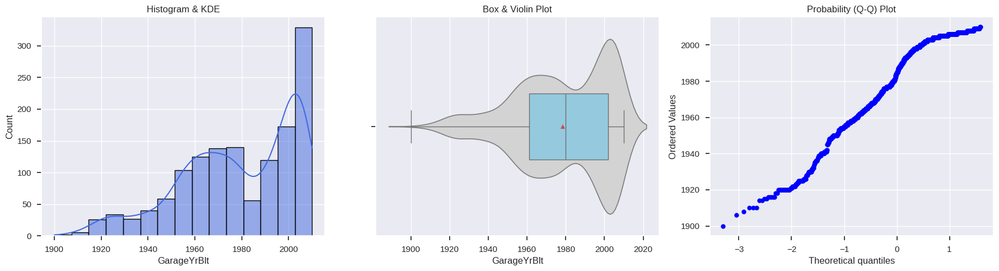

--- Analysis for: MSSubClass ---
Mean: 56.90 | Median: 50.00
Skewness: 1.41 | Kurtosis: 1.58
Outliers detected: 103 (Bounds: -55.00 to 145.00)



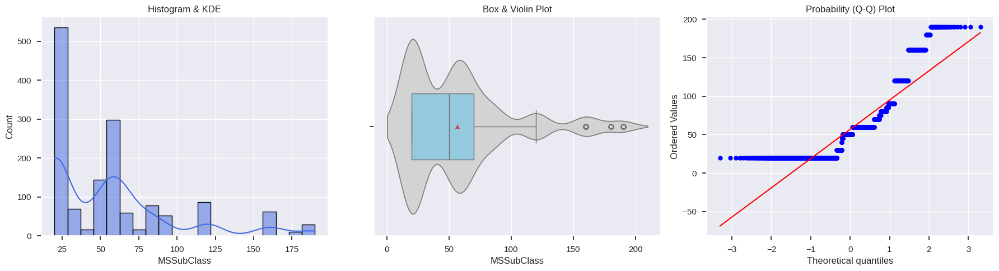

--- Analysis for: LotArea ---
Mean: 10516.83 | Median: 9478.50
Skewness: 12.21 | Kurtosis: 203.24
Outliers detected: 69 (Bounds: 1481.50 to 17673.50)



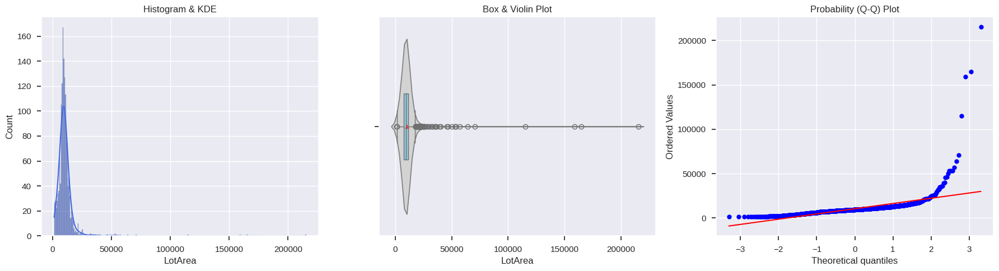

--- Analysis for: YearBuilt ---
Mean: 1971.27 | Median: 1973.00
Skewness: -0.61 | Kurtosis: -0.44
Outliers detected: 7 (Bounds: 1885.00 to 2069.00)



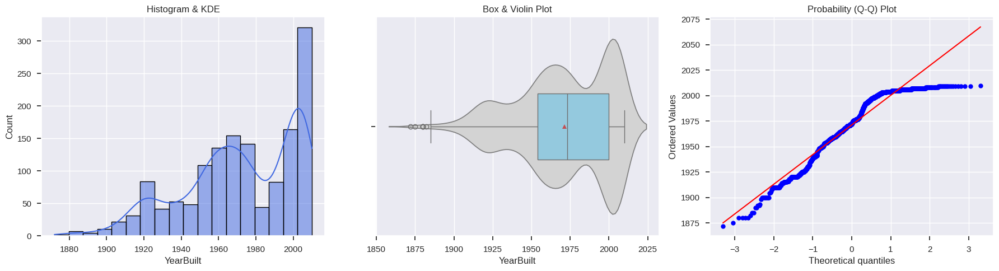

--- Analysis for: YearRemodAdd ---
Mean: 1984.87 | Median: 1994.00
Skewness: -0.50 | Kurtosis: -1.27
Outliers detected: 0 (Bounds: 1911.50 to 2059.50)



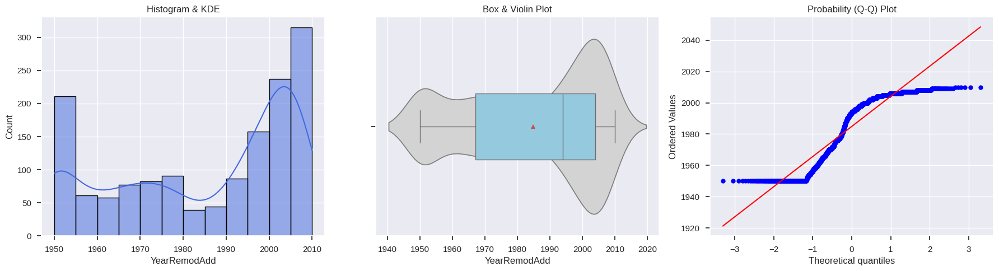

--- Analysis for: BsmtFinSF1 ---
Mean: 443.64 | Median: 383.50
Skewness: 1.69 | Kurtosis: 11.12
Outliers detected: 7 (Bounds: -1068.38 to 1780.62)



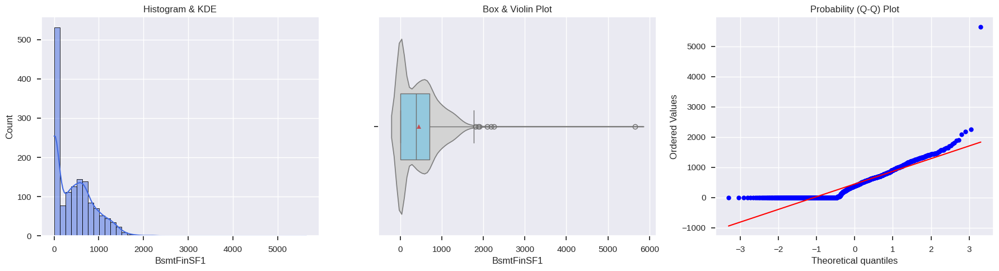

--- Analysis for: BsmtFinSF2 ---
Mean: 46.55 | Median: 0.00
Skewness: 4.26 | Kurtosis: 20.11
Outliers detected: 167 (Bounds: 0.00 to 0.00)



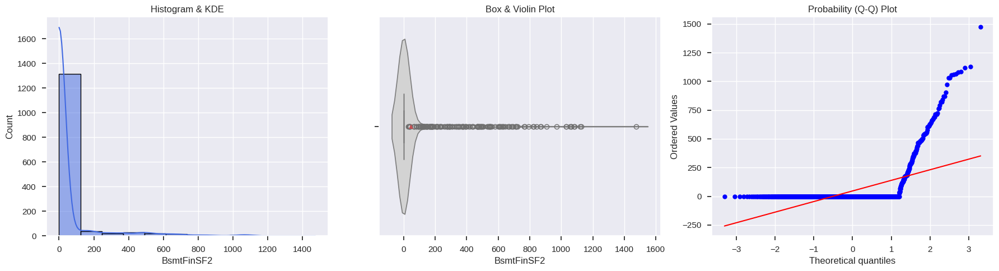

--- Analysis for: BsmtUnfSF ---
Mean: 567.24 | Median: 477.50
Skewness: 0.92 | Kurtosis: 0.47
Outliers detected: 29 (Bounds: -654.50 to 1685.50)



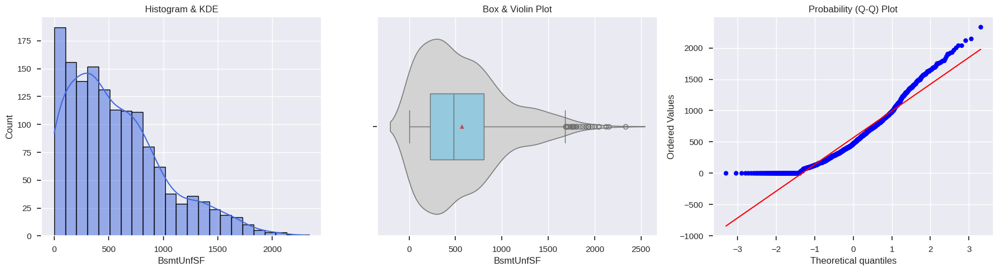

--- Analysis for: TotalBsmtSF ---
Mean: 1057.43 | Median: 991.50
Skewness: 1.52 | Kurtosis: 13.25
Outliers detected: 61 (Bounds: 42.00 to 2052.00)



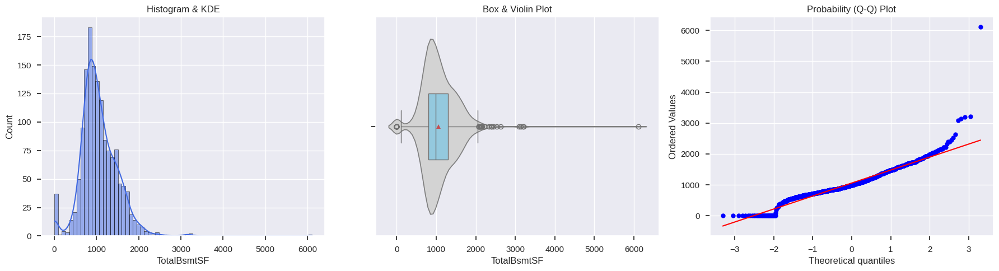

--- Analysis for: 1stFlrSF ---
Mean: 1162.63 | Median: 1087.00
Skewness: 1.38 | Kurtosis: 5.75
Outliers detected: 20 (Bounds: 118.12 to 2155.12)



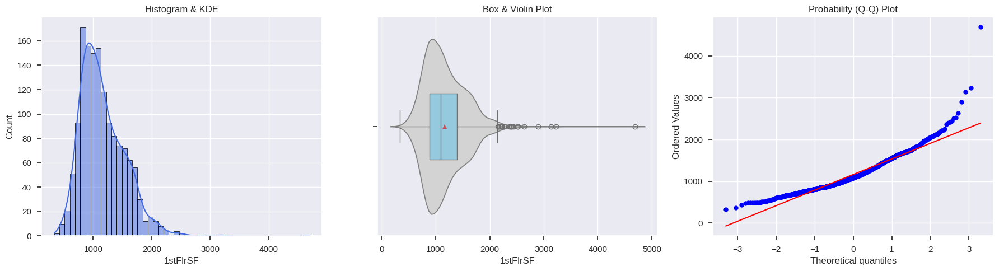

--- Analysis for: 2ndFlrSF ---
Mean: 346.99 | Median: 0.00
Skewness: 0.81 | Kurtosis: -0.55
Outliers detected: 2 (Bounds: -1092.00 to 1820.00)



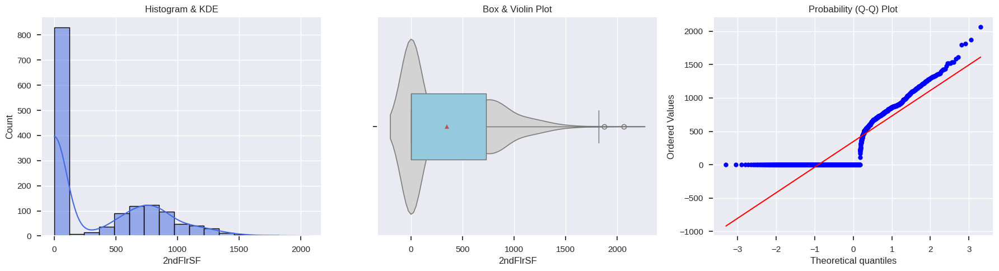

--- Analysis for: LowQualFinSF ---
Mean: 5.84 | Median: 0.00
Skewness: 9.01 | Kurtosis: 83.23
Outliers detected: 26 (Bounds: 0.00 to 0.00)



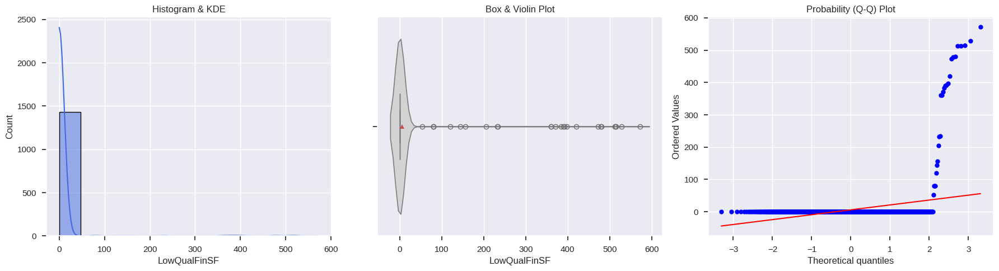

--- Analysis for: GrLivArea ---
Mean: 1515.46 | Median: 1464.00
Skewness: 1.37 | Kurtosis: 4.90
Outliers detected: 31 (Bounds: 158.62 to 2747.62)



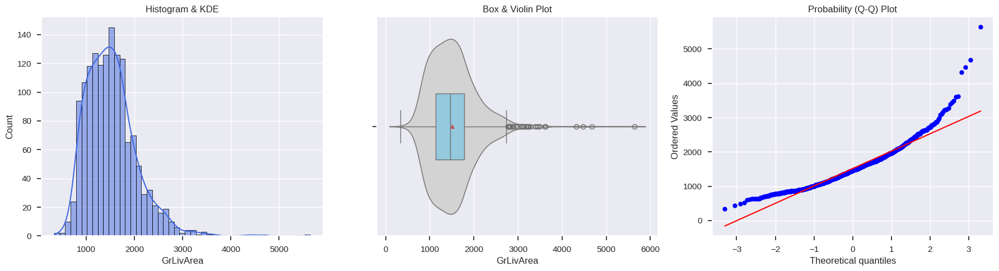

--- Analysis for: BsmtFullBath ---
Mean: 0.43 | Median: 0.00
Skewness: 0.60 | Kurtosis: -0.84
Outliers detected: 1 (Bounds: -1.50 to 2.50)



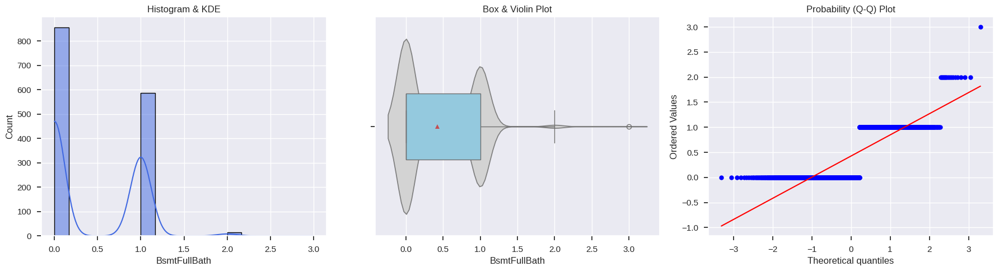

--- Analysis for: BsmtHalfBath ---
Mean: 0.06 | Median: 0.00
Skewness: 4.10 | Kurtosis: 16.40
Outliers detected: 82 (Bounds: 0.00 to 0.00)



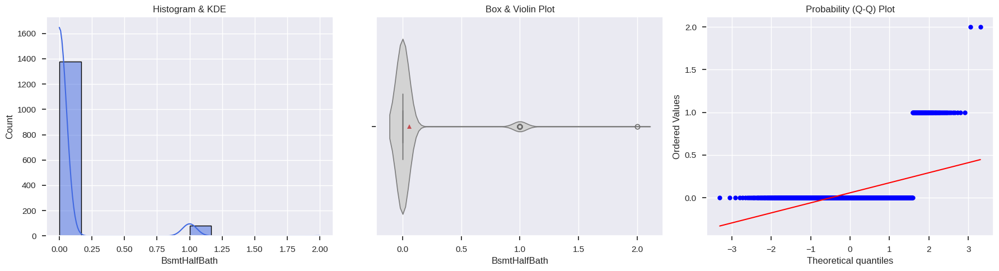

--- Analysis for: FullBath ---
Mean: 1.57 | Median: 2.00
Skewness: 0.04 | Kurtosis: -0.86
Outliers detected: 0 (Bounds: -0.50 to 3.50)



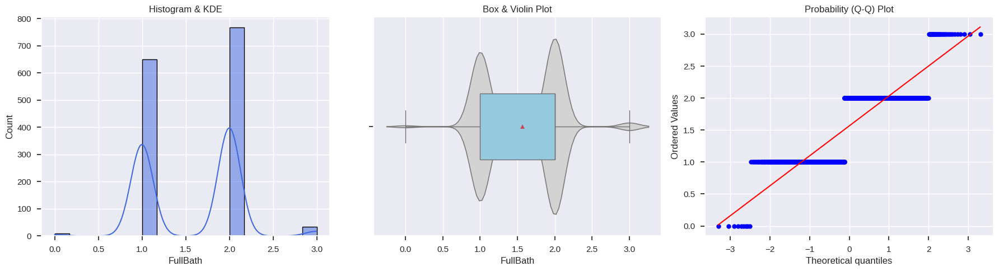

--- Analysis for: HalfBath ---
Mean: 0.38 | Median: 0.00
Skewness: 0.68 | Kurtosis: -1.08
Outliers detected: 0 (Bounds: -1.50 to 2.50)



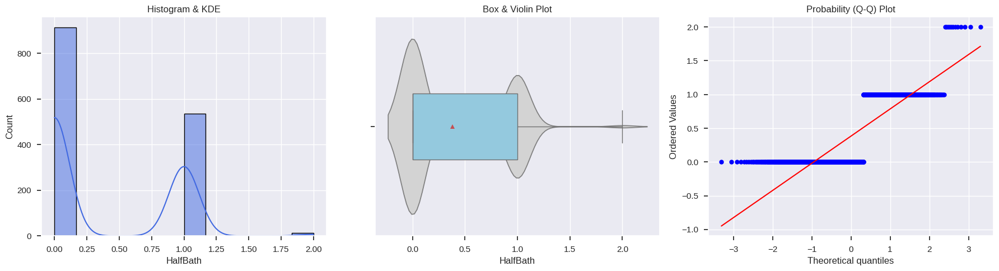

--- Analysis for: BedroomAbvGr ---
Mean: 2.87 | Median: 3.00
Skewness: 0.21 | Kurtosis: 2.23
Outliers detected: 35 (Bounds: 0.50 to 4.50)



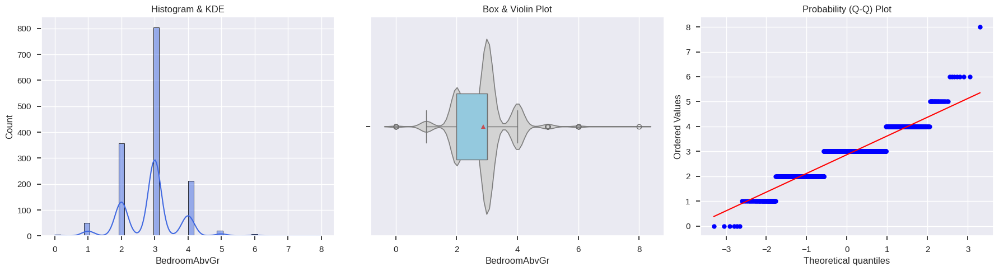

--- Analysis for: KitchenAbvGr ---
Mean: 1.05 | Median: 1.00
Skewness: 4.49 | Kurtosis: 21.53
Outliers detected: 68 (Bounds: 1.00 to 1.00)



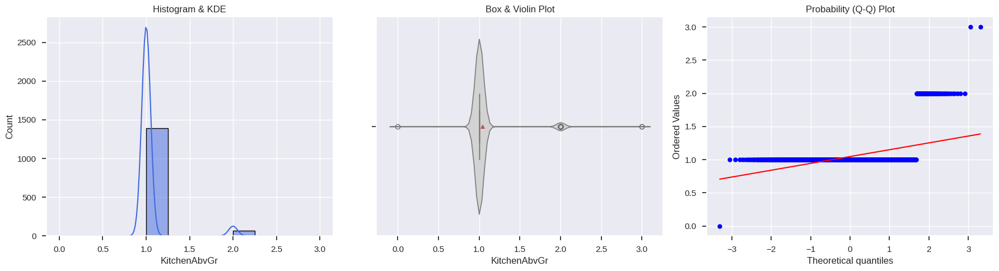

--- Analysis for: TotRmsAbvGrd ---
Mean: 6.52 | Median: 6.00
Skewness: 0.68 | Kurtosis: 0.88
Outliers detected: 30 (Bounds: 2.00 to 10.00)



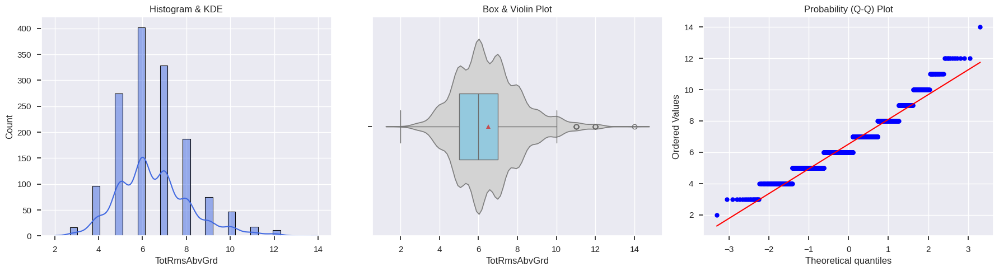

--- Analysis for: Fireplaces ---
Mean: 0.61 | Median: 1.00
Skewness: 0.65 | Kurtosis: -0.22
Outliers detected: 5 (Bounds: -1.50 to 2.50)



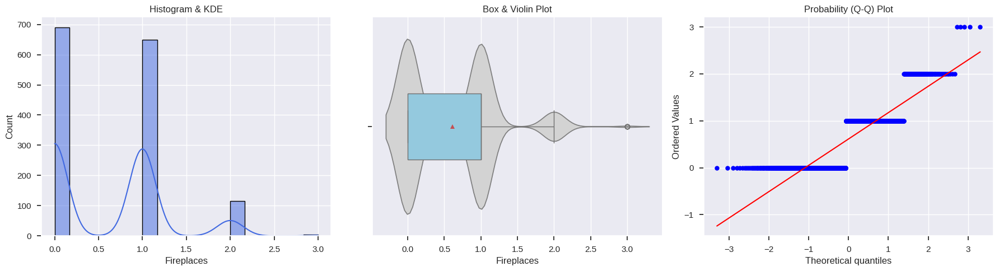

--- Analysis for: GarageCars ---
Mean: 1.77 | Median: 2.00
Skewness: -0.34 | Kurtosis: 0.22
Outliers detected: 5 (Bounds: -0.50 to 3.50)



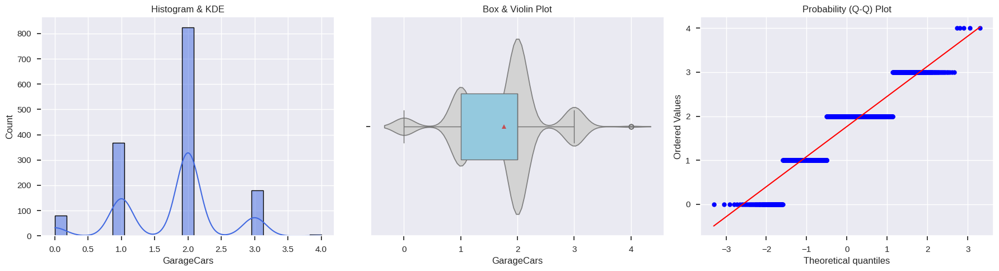

--- Analysis for: GarageArea ---
Mean: 472.98 | Median: 480.00
Skewness: 0.18 | Kurtosis: 0.92
Outliers detected: 21 (Bounds: -27.75 to 938.25)



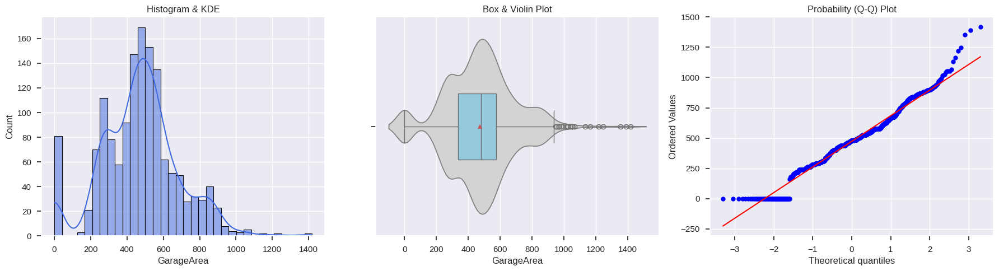

--- Analysis for: WoodDeckSF ---
Mean: 94.24 | Median: 0.00
Skewness: 1.54 | Kurtosis: 2.99
Outliers detected: 32 (Bounds: -252.00 to 420.00)



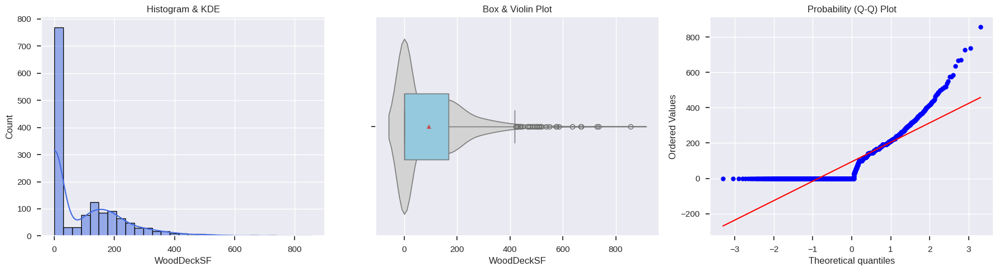

--- Analysis for: OpenPorchSF ---
Mean: 46.66 | Median: 25.00
Skewness: 2.36 | Kurtosis: 8.49
Outliers detected: 77 (Bounds: -102.00 to 170.00)



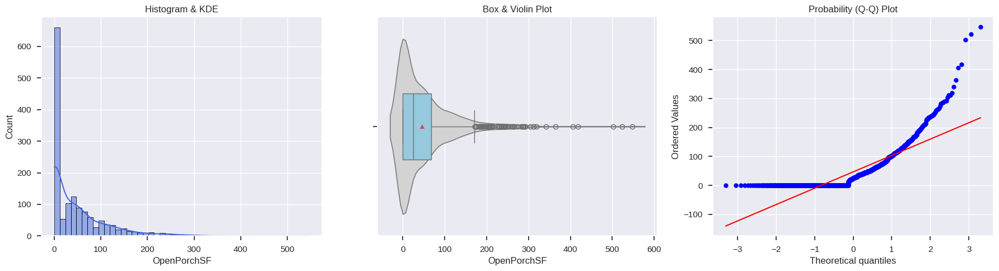

--- Analysis for: EnclosedPorch ---
Mean: 21.95 | Median: 0.00
Skewness: 3.09 | Kurtosis: 10.43
Outliers detected: 208 (Bounds: 0.00 to 0.00)



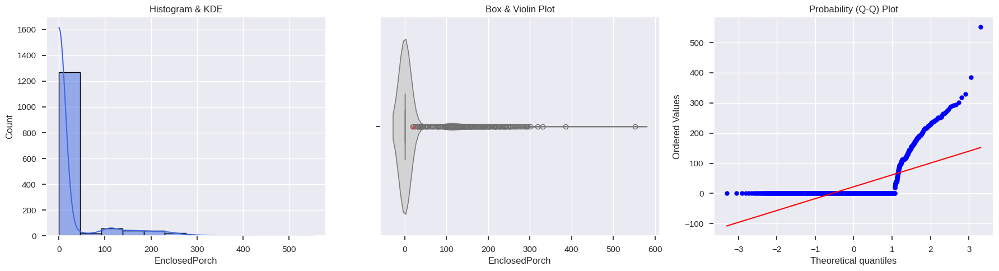

--- Analysis for: 3SsnPorch ---
Mean: 3.41 | Median: 0.00
Skewness: 10.30 | Kurtosis: 123.66
Outliers detected: 24 (Bounds: 0.00 to 0.00)



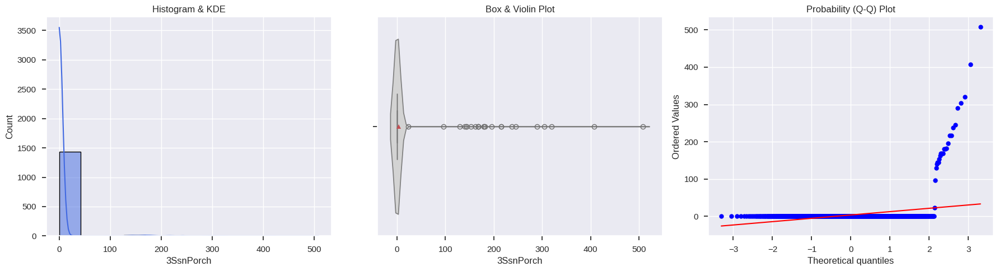

--- Analysis for: ScreenPorch ---
Mean: 15.06 | Median: 0.00
Skewness: 4.12 | Kurtosis: 18.44
Outliers detected: 116 (Bounds: 0.00 to 0.00)



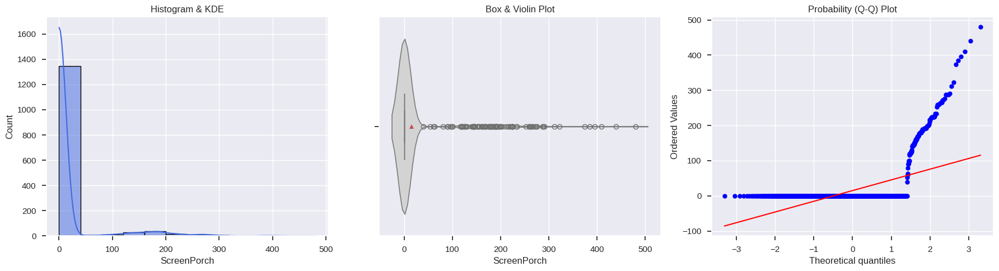

--- Analysis for: PoolArea ---
Mean: 2.76 | Median: 0.00
Skewness: 14.83 | Kurtosis: 223.27
Outliers detected: 7 (Bounds: 0.00 to 0.00)



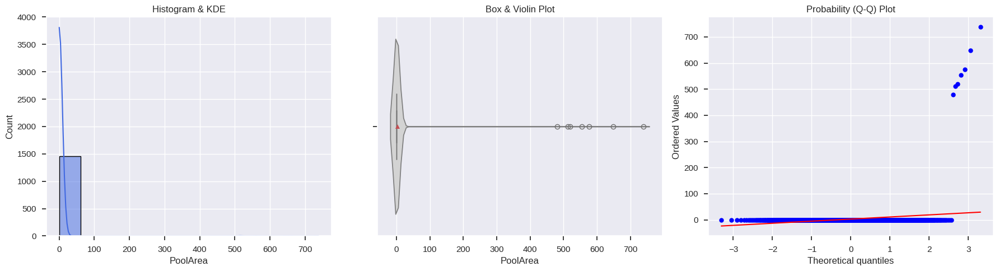

--- Analysis for: MiscVal ---
Mean: 43.49 | Median: 0.00
Skewness: 24.48 | Kurtosis: 701.00
Outliers detected: 52 (Bounds: 0.00 to 0.00)



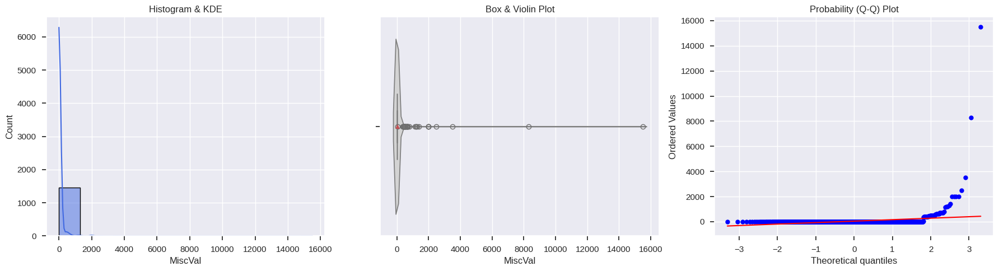

--- Analysis for: MoSold ---
Mean: 6.32 | Median: 6.00
Skewness: 0.21 | Kurtosis: -0.40
Outliers detected: 0 (Bounds: 0.50 to 12.50)



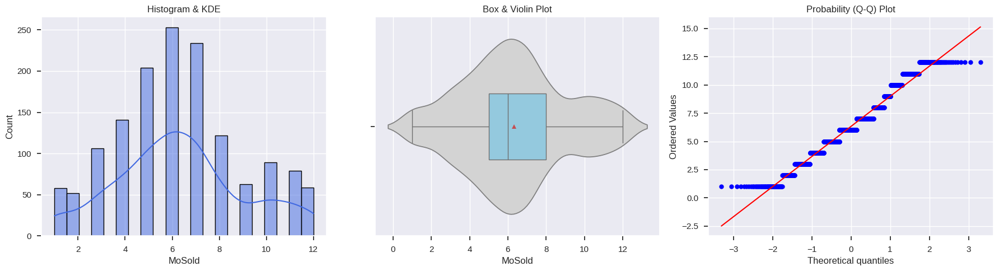

--- Analysis for: YrSold ---
Mean: 2007.82 | Median: 2008.00
Skewness: 0.10 | Kurtosis: -1.19
Outliers detected: 0 (Bounds: 2004.00 to 2012.00)



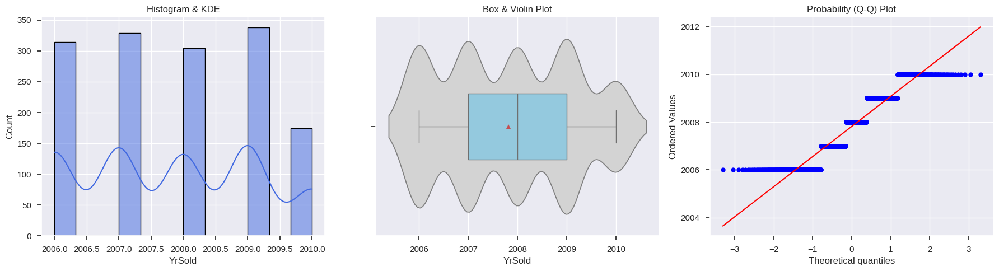

--- Analysis for: SalePrice ---
Mean: 180921.20 | Median: 163000.00
Skewness: 1.88 | Kurtosis: 6.54
Outliers detected: 61 (Bounds: 3937.50 to 340037.50)



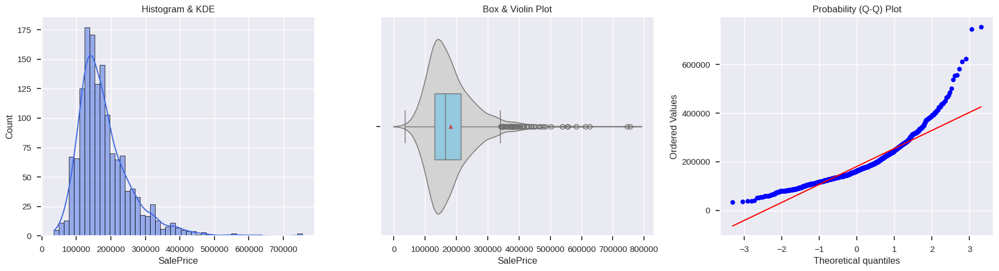

--- Categorical Analysis: MSZoning ---
Cardinality (unique): 5
Dominant category: RL (78.8%)
Rare categories (<5%): ['FV', 'RH', 'C (all)']


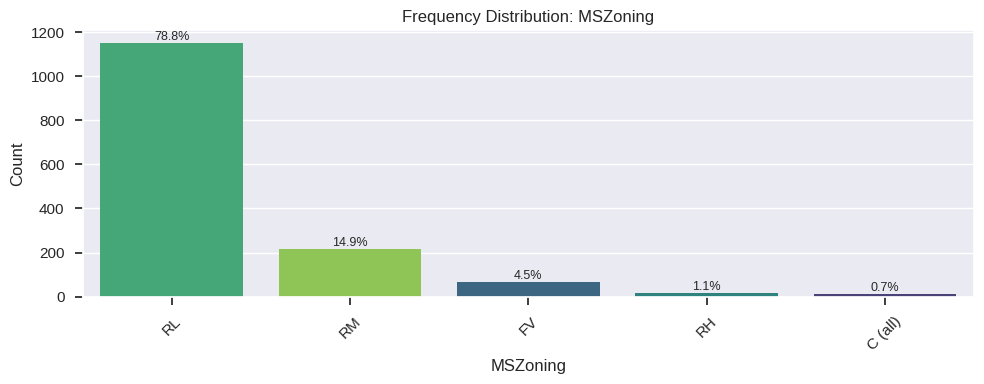

----------------------------------------

--- Categorical Analysis: Street ---
Cardinality (unique): 2
Dominant category: Pave (99.6%)
Rare categories (<5%): ['Grvl']


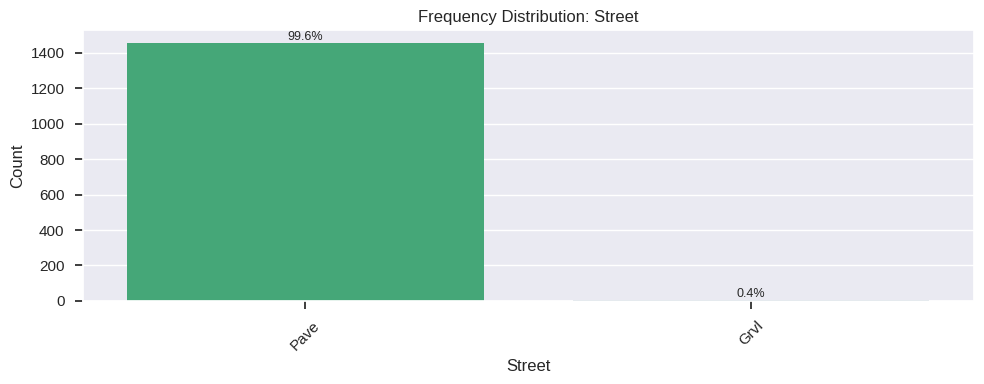

----------------------------------------

--- Categorical Analysis: LotShape ---
Cardinality (unique): 4
Dominant category: Reg (63.4%)
Rare categories (<5%): ['IR2', 'IR3']


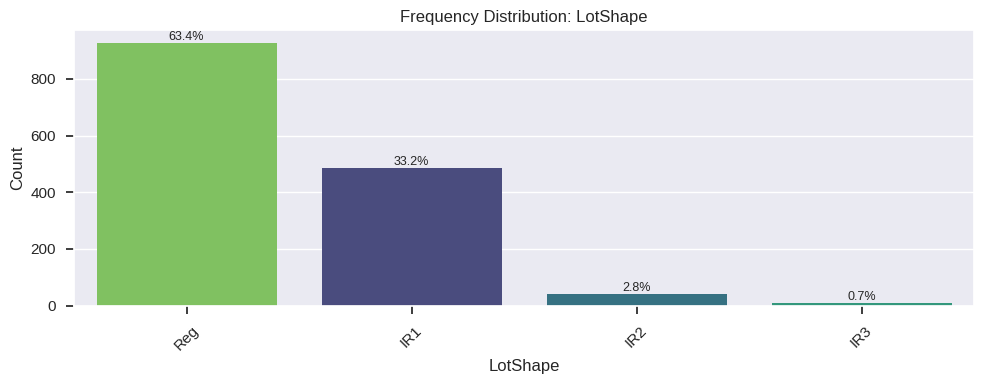

----------------------------------------

--- Categorical Analysis: LandContour ---
Cardinality (unique): 4
Dominant category: Lvl (89.8%)
Rare categories (<5%): ['Bnk', 'HLS', 'Low']


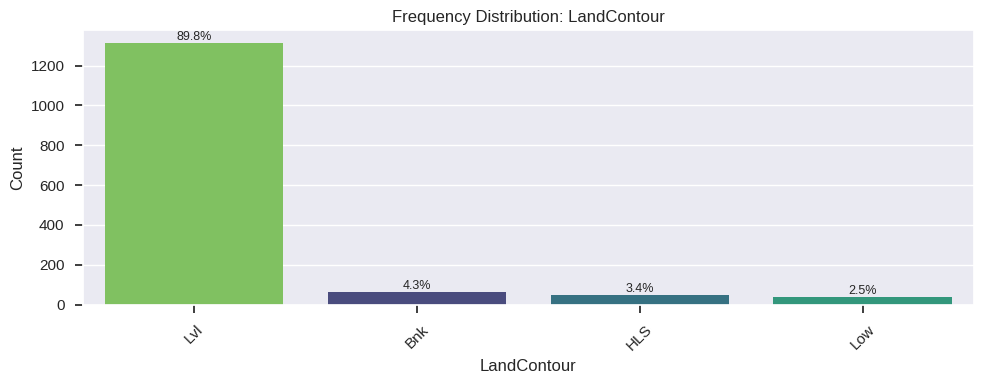

----------------------------------------

--- Categorical Analysis: Utilities ---
Cardinality (unique): 2
Dominant category: AllPub (99.9%)
Rare categories (<5%): ['NoSeWa']


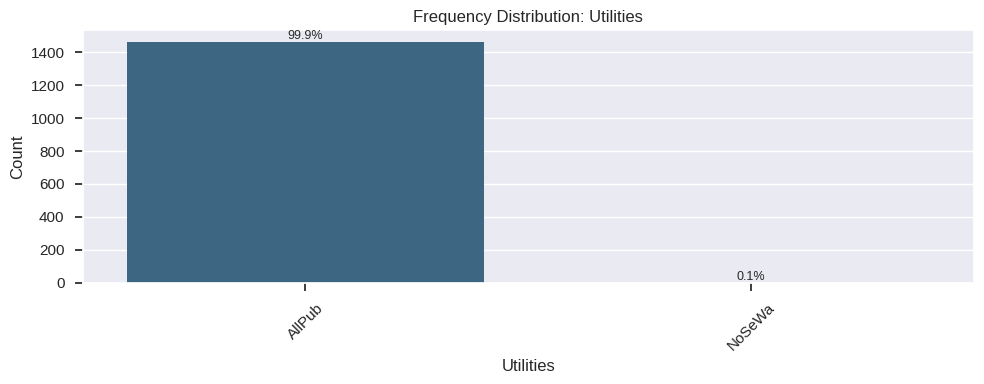

----------------------------------------

--- Categorical Analysis: LotConfig ---
Cardinality (unique): 5
Dominant category: Inside (72.1%)
Rare categories (<5%): ['FR2', 'FR3']


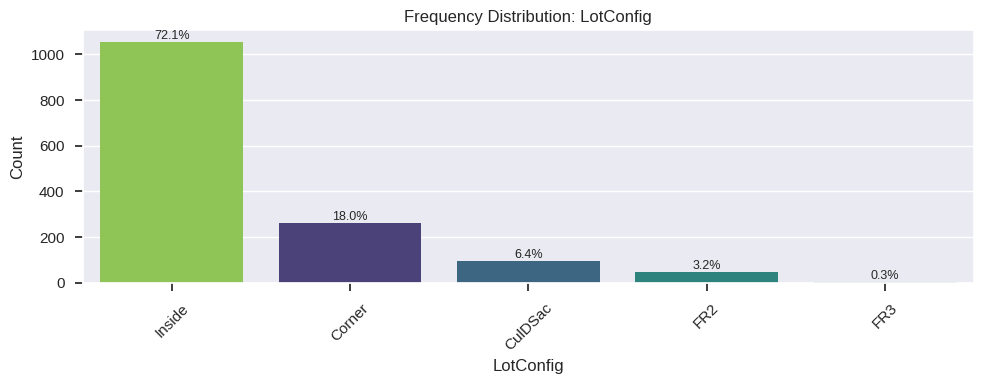

----------------------------------------

--- Categorical Analysis: LandSlope ---
Cardinality (unique): 3
Dominant category: Gtl (94.7%)
Rare categories (<5%): ['Mod', 'Sev']


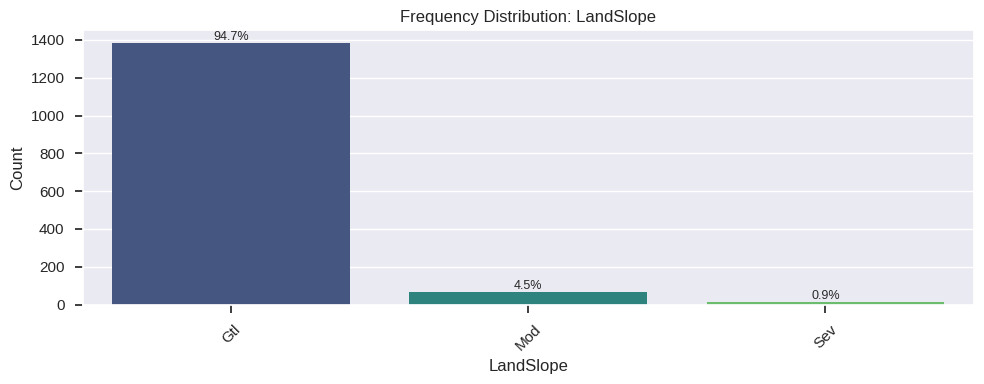

----------------------------------------

--- Categorical Analysis: Neighborhood ---
Cardinality (unique): 25
Dominant category: NAmes (15.4%)
Rare categories (<5%): ['SawyerW', 'BrkSide', 'Crawfor', 'Mitchel', 'NoRidge', 'Timber', 'IDOTRR', 'ClearCr', 'StoneBr', 'SWISU', 'Blmngtn', 'MeadowV', 'BrDale', 'Veenker', 'NPkVill', 'Blueste']


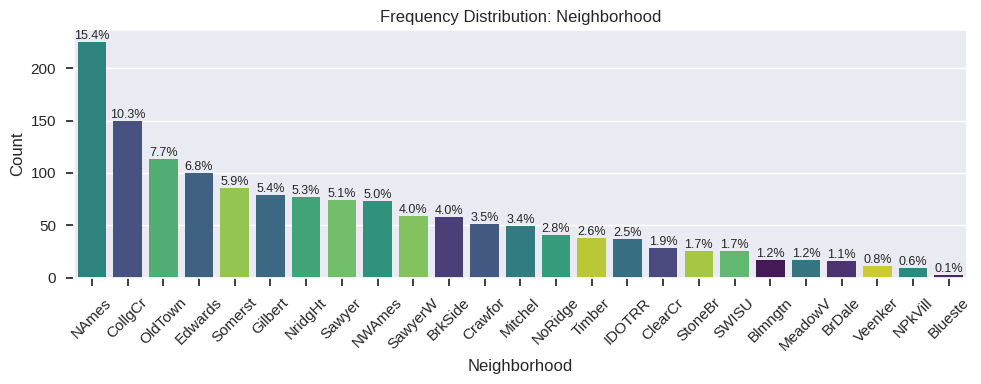

----------------------------------------

--- Categorical Analysis: Condition1 ---
Cardinality (unique): 9
Dominant category: Norm (86.3%)
Rare categories (<5%): ['Artery', 'RRAn', 'PosN', 'RRAe', 'PosA', 'RRNn', 'RRNe']


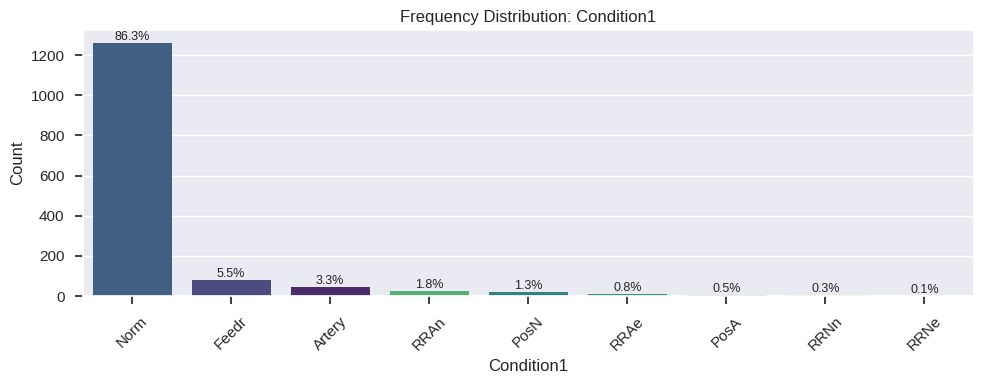

----------------------------------------

--- Categorical Analysis: Condition2 ---
Cardinality (unique): 8
Dominant category: Norm (99.0%)
Rare categories (<5%): ['Feedr', 'Artery', 'PosN', 'RRNn', 'PosA', 'RRAe', 'RRAn']


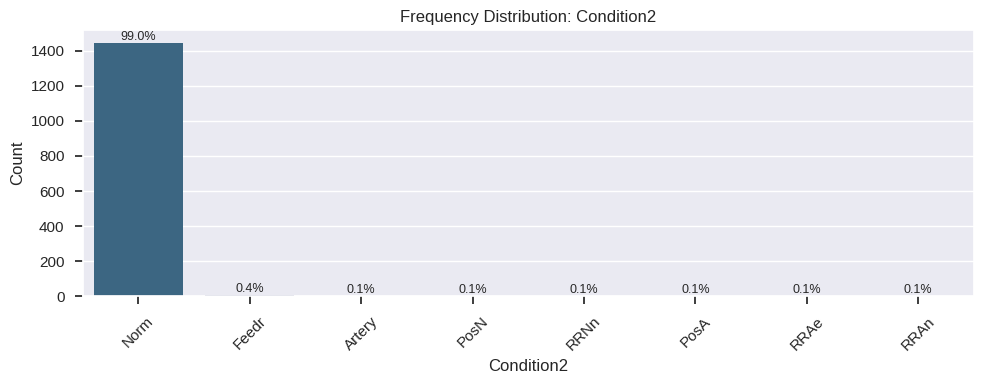

----------------------------------------

--- Categorical Analysis: BldgType ---
Cardinality (unique): 5
Dominant category: 1Fam (83.6%)
Rare categories (<5%): ['Duplex', 'Twnhs', '2fmCon']


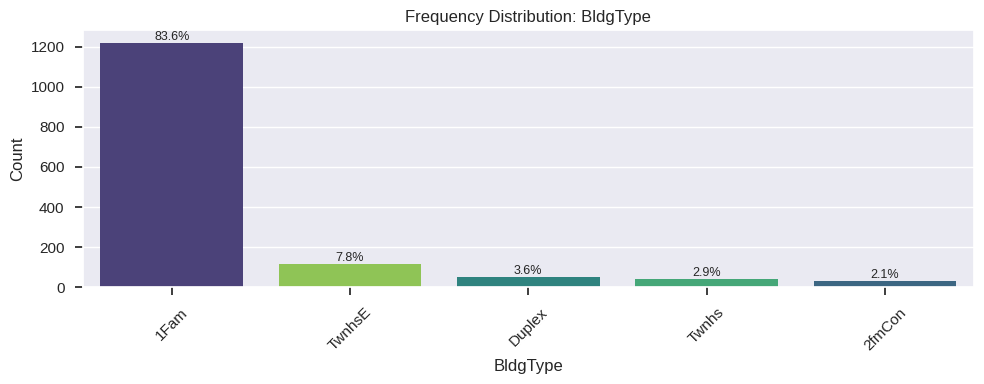

----------------------------------------

--- Categorical Analysis: HouseStyle ---
Cardinality (unique): 8
Dominant category: 1Story (49.7%)
Rare categories (<5%): ['SLvl', 'SFoyer', '1.5Unf', '2.5Unf', '2.5Fin']


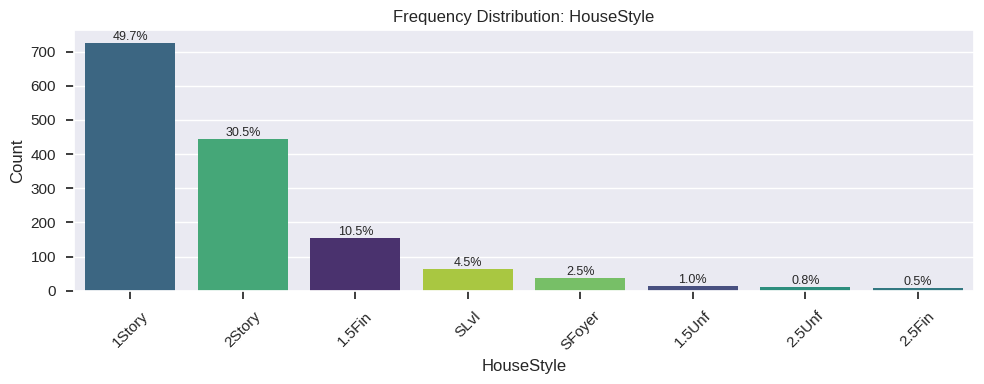

----------------------------------------

--- Categorical Analysis: RoofStyle ---
Cardinality (unique): 6
Dominant category: Gable (78.2%)
Rare categories (<5%): ['Flat', 'Gambrel', 'Mansard', 'Shed']


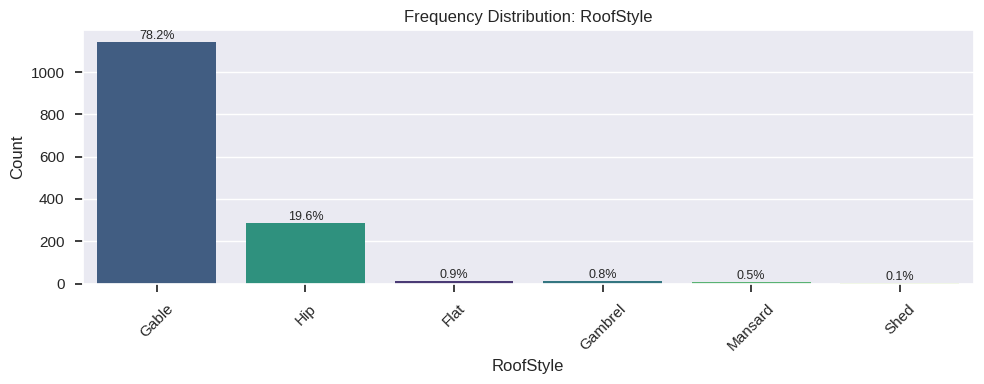

----------------------------------------

--- Categorical Analysis: RoofMatl ---
Cardinality (unique): 8
Dominant category: CompShg (98.2%)
Rare categories (<5%): ['Tar&Grv', 'WdShngl', 'WdShake', 'Metal', 'Membran', 'ClyTile', 'Roll']


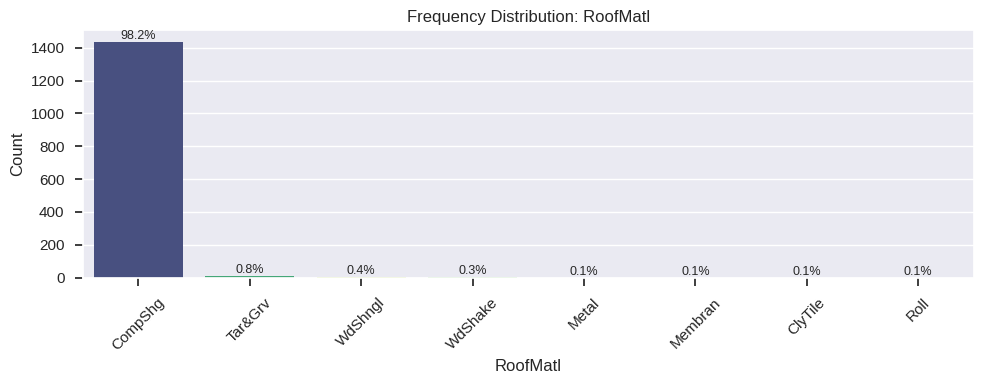

----------------------------------------

--- Categorical Analysis: Exterior1st ---
Cardinality (unique): 15
Dominant category: VinylSd (35.3%)
Rare categories (<5%): ['CemntBd', 'BrkFace', 'WdShing', 'Stucco', 'AsbShng', 'BrkComm', 'Stone', 'AsphShn', 'CBlock', 'ImStucc']


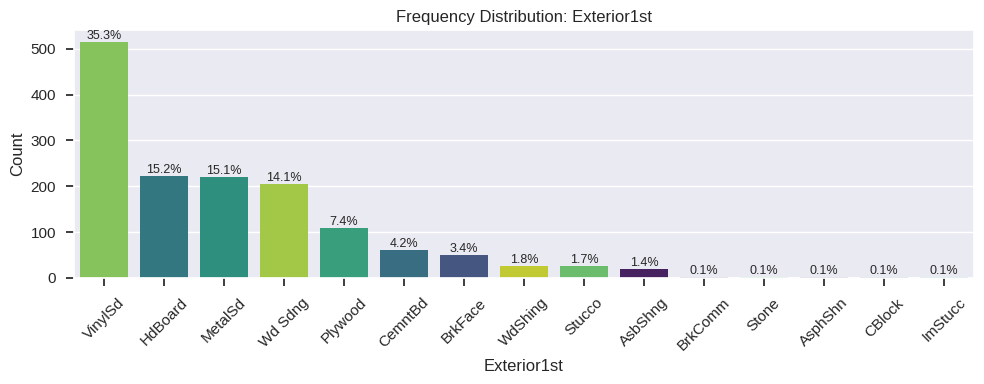

----------------------------------------

--- Categorical Analysis: Exterior2nd ---
Cardinality (unique): 16
Dominant category: VinylSd (34.5%)
Rare categories (<5%): ['CmentBd', 'Wd Shng', 'Stucco', 'BrkFace', 'AsbShng', 'ImStucc', 'Brk Cmn', 'Stone', 'AsphShn', 'CBlock', 'Other']


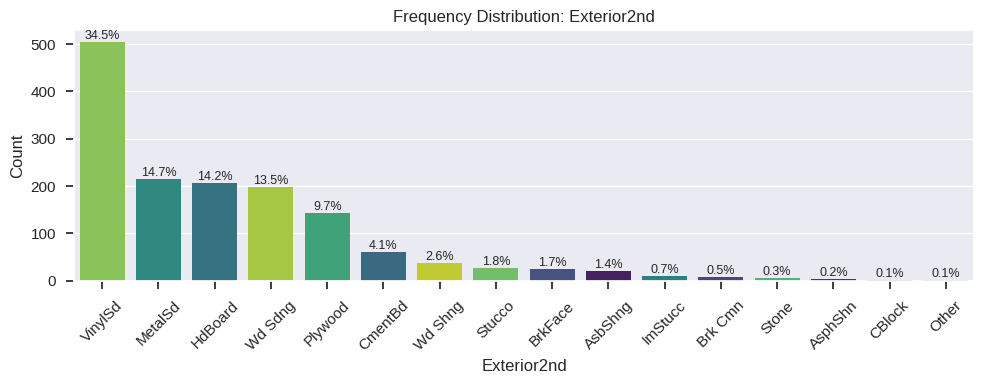

----------------------------------------

--- Categorical Analysis: ExterQual ---
Cardinality (unique): 4
Dominant category: TA (62.1%)
Rare categories (<5%): ['Ex', 'Fa']


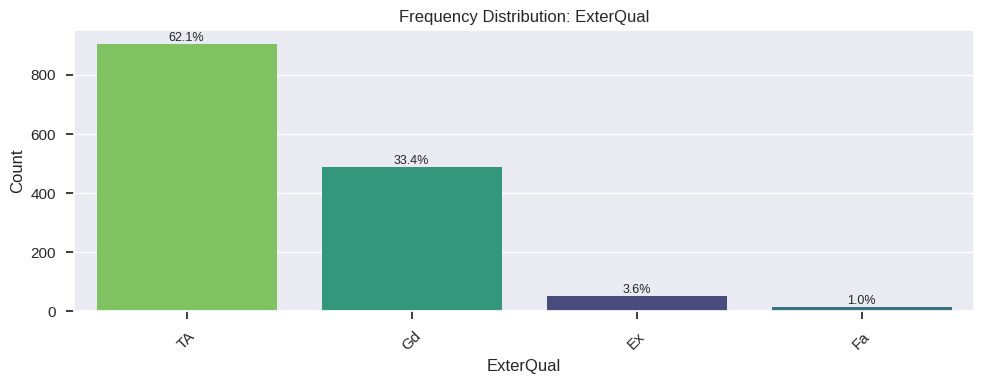

----------------------------------------

--- Categorical Analysis: ExterCond ---
Cardinality (unique): 5
Dominant category: TA (87.8%)
Rare categories (<5%): ['Fa', 'Ex', 'Po']


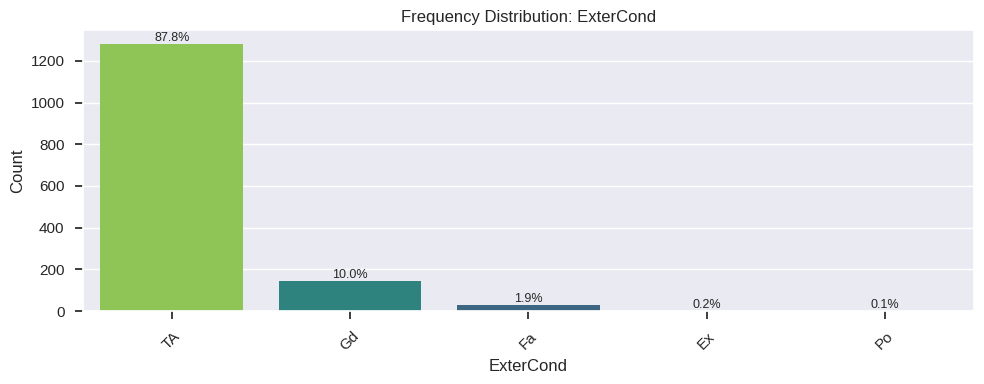

----------------------------------------

--- Categorical Analysis: Foundation ---
Cardinality (unique): 6
Dominant category: PConc (44.3%)
Rare categories (<5%): ['Slab', 'Stone', 'Wood']


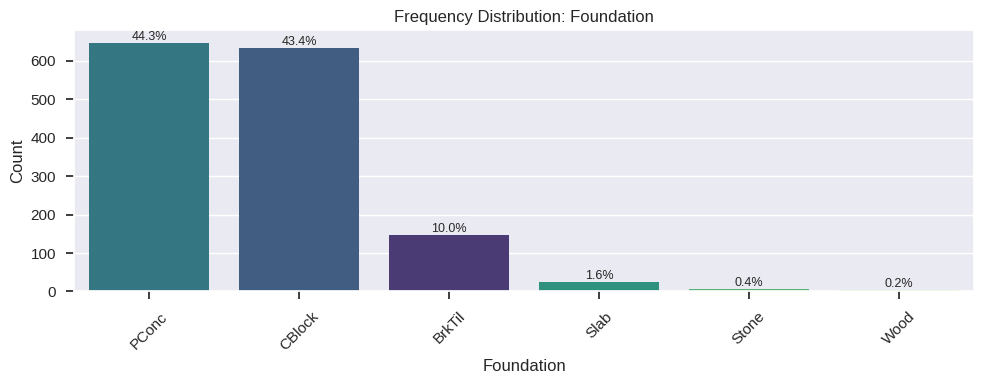

----------------------------------------

--- Categorical Analysis: BsmtQual ---
Cardinality (unique): 4
Dominant category: TA (45.6%)
Rare categories (<5%): ['Fa']


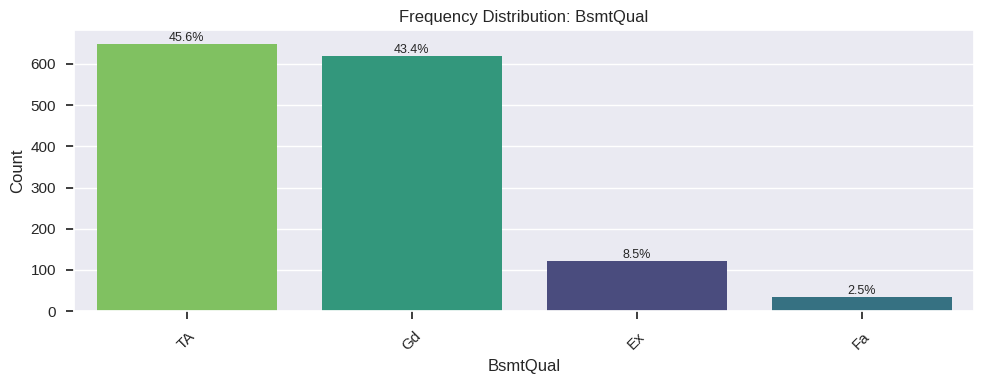

----------------------------------------

--- Categorical Analysis: BsmtCond ---
Cardinality (unique): 4
Dominant category: TA (92.1%)
Rare categories (<5%): ['Gd', 'Fa', 'Po']


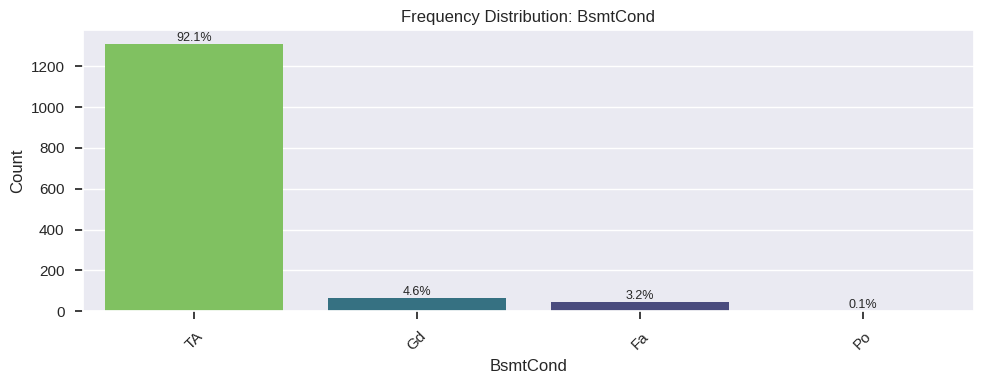

----------------------------------------

--- Categorical Analysis: BsmtExposure ---
Cardinality (unique): 4
Dominant category: No (67.0%)
No rare categories


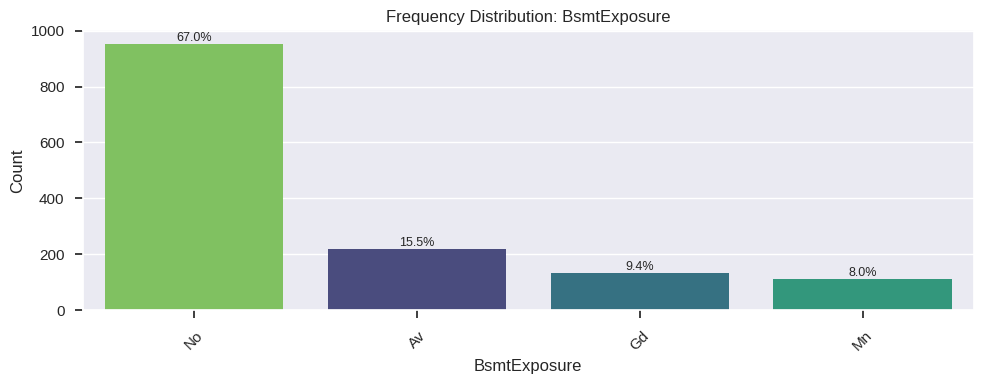

----------------------------------------

--- Categorical Analysis: BsmtFinType1 ---
Cardinality (unique): 6
Dominant category: Unf (30.2%)
No rare categories


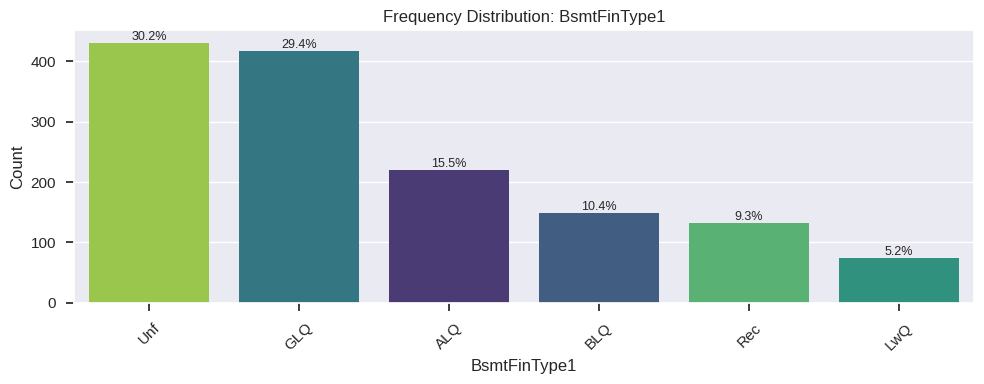

----------------------------------------

--- Categorical Analysis: BsmtFinType2 ---
Cardinality (unique): 6
Dominant category: Unf (88.3%)
Rare categories (<5%): ['Rec', 'LwQ', 'BLQ', 'ALQ', 'GLQ']


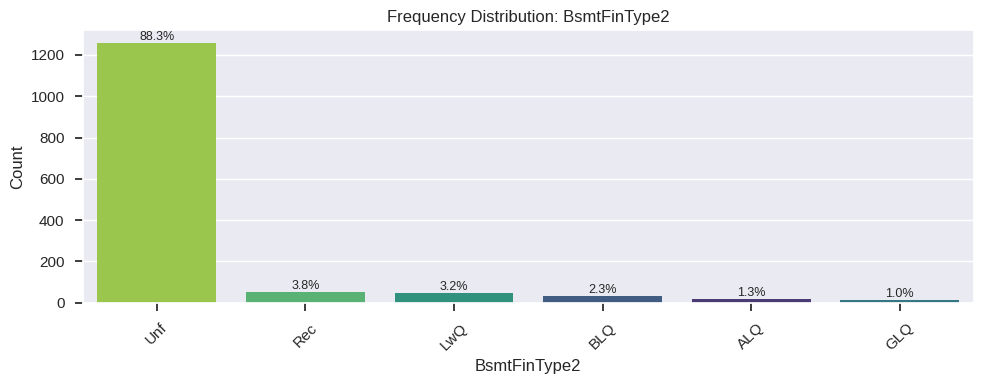

----------------------------------------

--- Categorical Analysis: Heating ---
Cardinality (unique): 6
Dominant category: GasA (97.8%)
Rare categories (<5%): ['GasW', 'Grav', 'Wall', 'OthW', 'Floor']


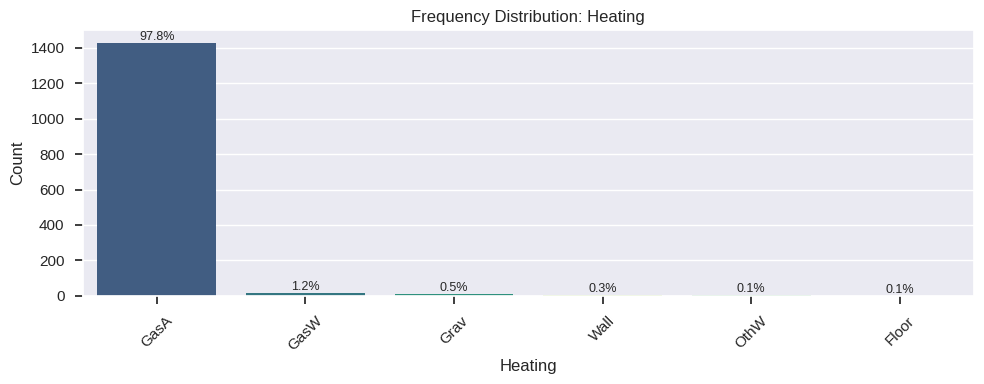

----------------------------------------

--- Categorical Analysis: HeatingQC ---
Cardinality (unique): 5
Dominant category: Ex (50.8%)
Rare categories (<5%): ['Fa', 'Po']


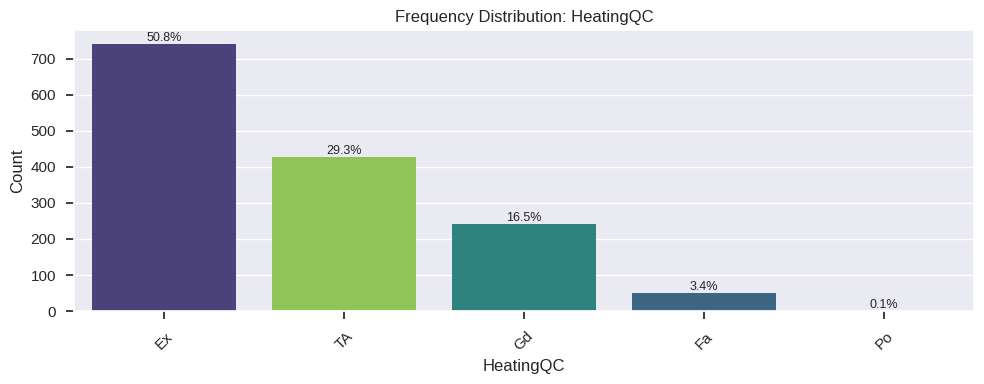

----------------------------------------

--- Categorical Analysis: CentralAir ---
Cardinality (unique): 2
Dominant category: Y (93.5%)
No rare categories


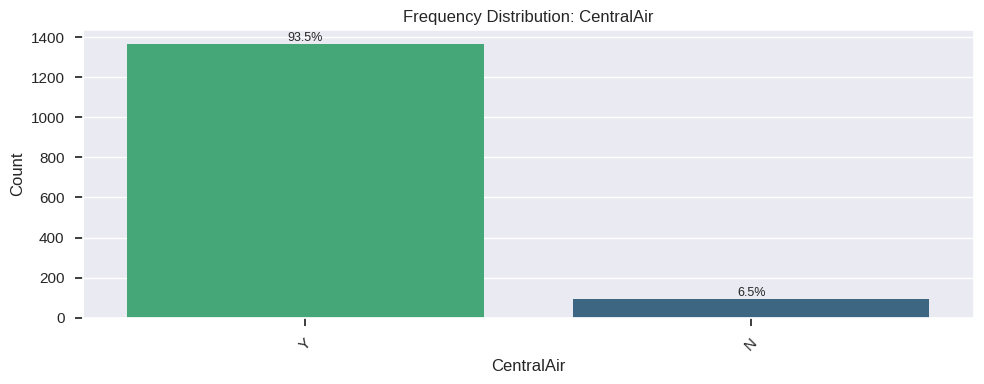

----------------------------------------

--- Categorical Analysis: Electrical ---
Cardinality (unique): 5
Dominant category: SBrkr (91.4%)
Rare categories (<5%): ['FuseF', 'FuseP', 'Mix']


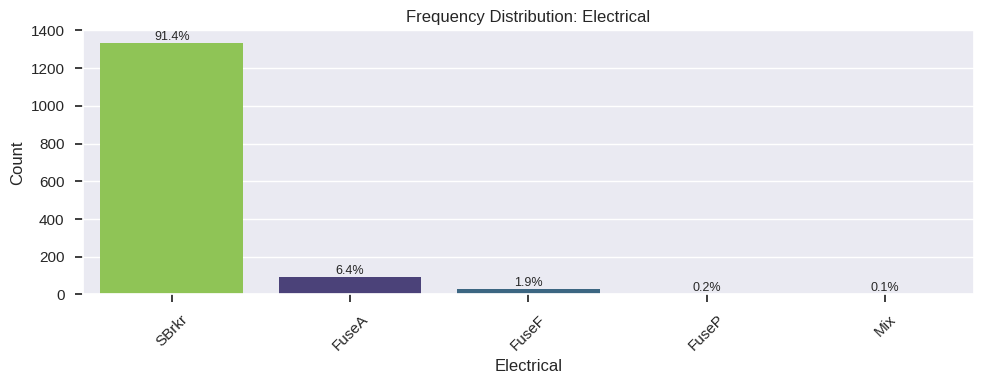

----------------------------------------

--- Categorical Analysis: KitchenQual ---
Cardinality (unique): 4
Dominant category: TA (50.3%)
Rare categories (<5%): ['Fa']


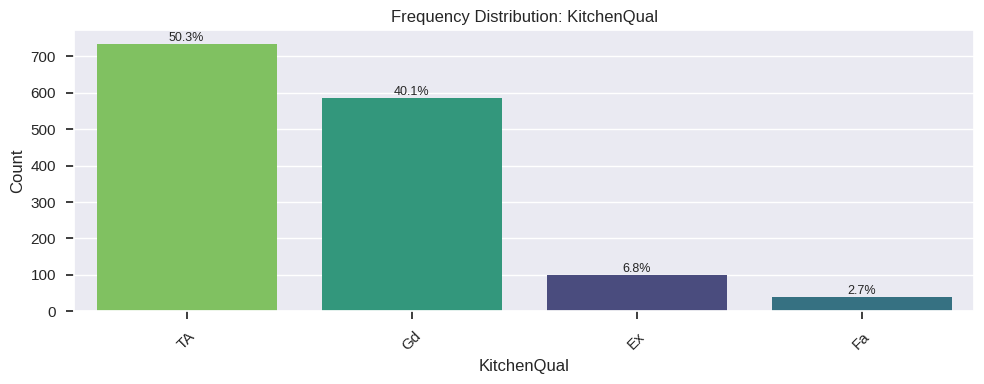

----------------------------------------

--- Categorical Analysis: Functional ---
Cardinality (unique): 7
Dominant category: Typ (93.2%)
Rare categories (<5%): ['Min2', 'Min1', 'Mod', 'Maj1', 'Maj2', 'Sev']


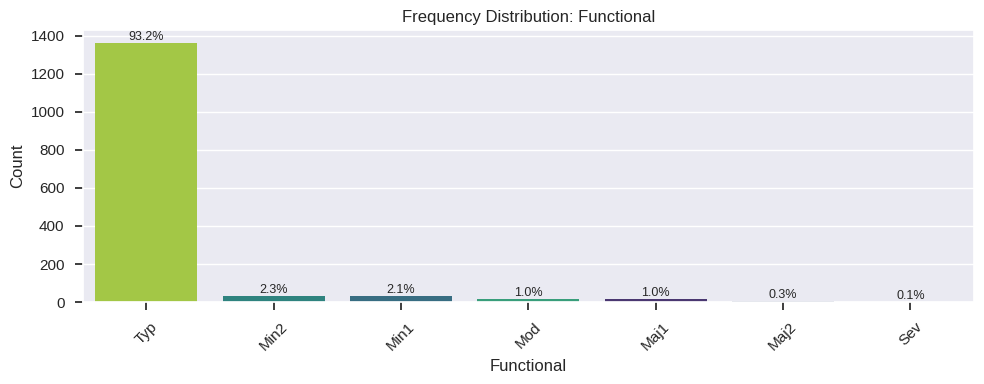

----------------------------------------

--- Categorical Analysis: GarageType ---
Cardinality (unique): 6
Dominant category: Attchd (63.1%)
Rare categories (<5%): ['Basment', 'CarPort', '2Types']


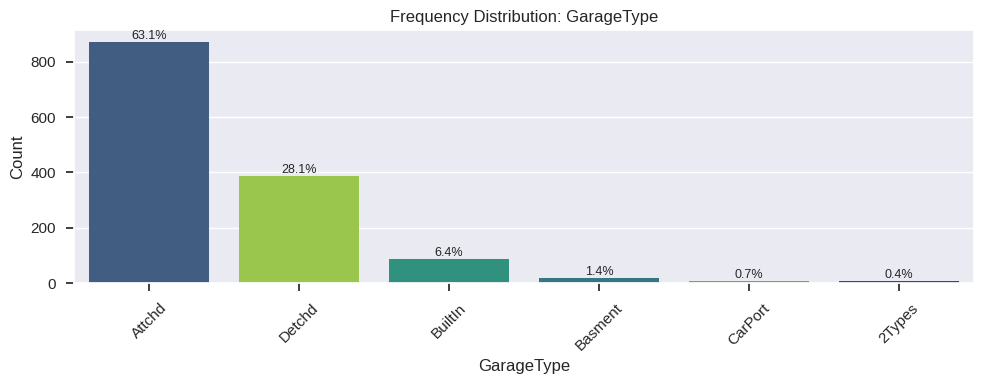

----------------------------------------

--- Categorical Analysis: GarageFinish ---
Cardinality (unique): 3
Dominant category: Unf (43.9%)
No rare categories


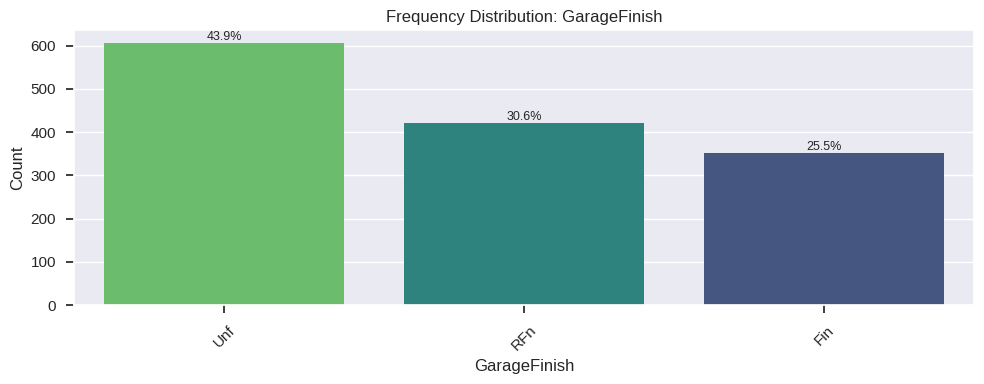

----------------------------------------

--- Categorical Analysis: GarageQual ---
Cardinality (unique): 5
Dominant category: TA (95.1%)
Rare categories (<5%): ['Fa', 'Gd', 'Ex', 'Po']


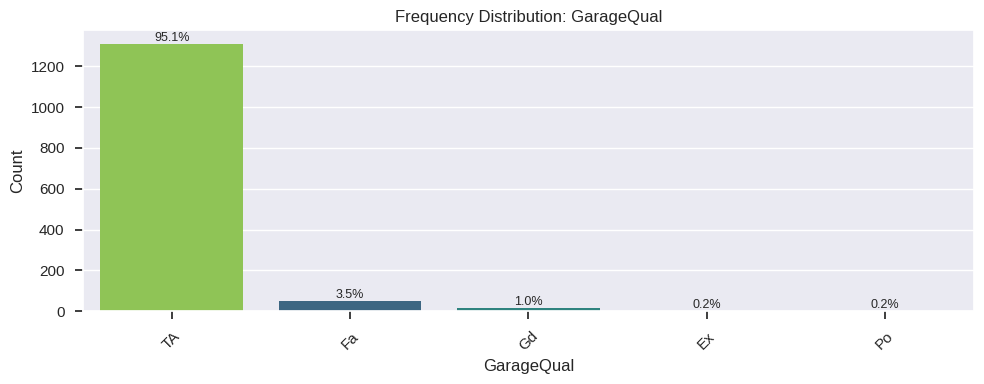

----------------------------------------

--- Categorical Analysis: GarageCond ---
Cardinality (unique): 5
Dominant category: TA (96.2%)
Rare categories (<5%): ['Fa', 'Gd', 'Po', 'Ex']


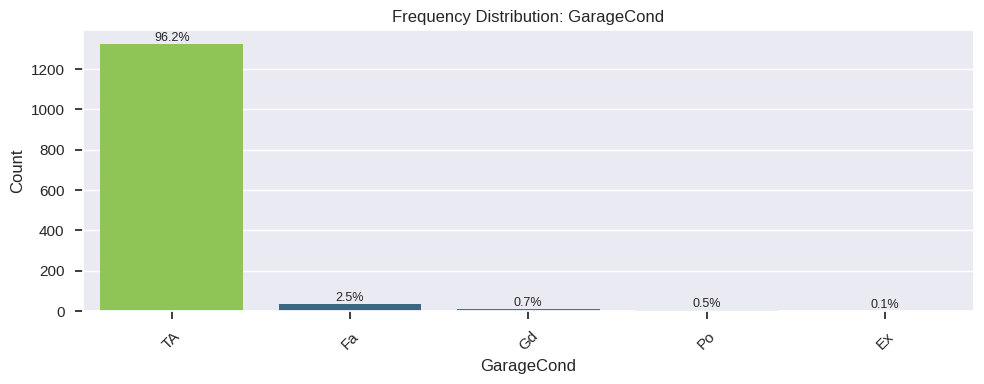

----------------------------------------

--- Categorical Analysis: PavedDrive ---
Cardinality (unique): 3
Dominant category: Y (91.8%)
Rare categories (<5%): ['P']


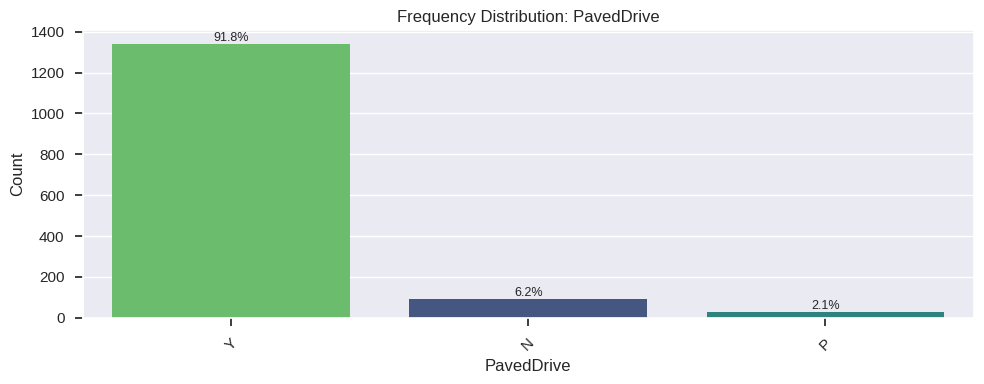

----------------------------------------

--- Categorical Analysis: SaleType ---
Cardinality (unique): 9
Dominant category: WD (86.8%)
Rare categories (<5%): ['COD', 'ConLD', 'ConLI', 'ConLw', 'CWD', 'Oth', 'Con']


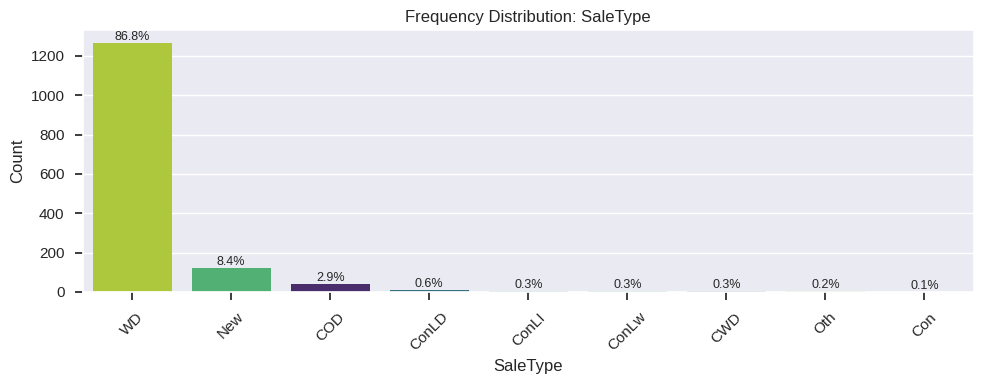

----------------------------------------

--- Categorical Analysis: SaleCondition ---
Cardinality (unique): 6
Dominant category: Normal (82.1%)
Rare categories (<5%): ['Family', 'Alloca', 'AdjLand']


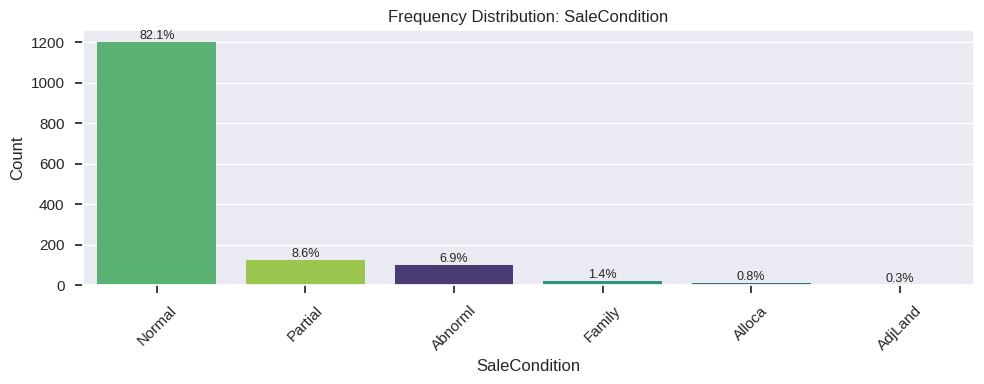

----------------------------------------

--- Categorical Analysis: OverallQual ---
Cardinality (unique): 10
Dominant category: 5 (27.2%)
Rare categories (<5%): [9, 3, 10, 2, 1]


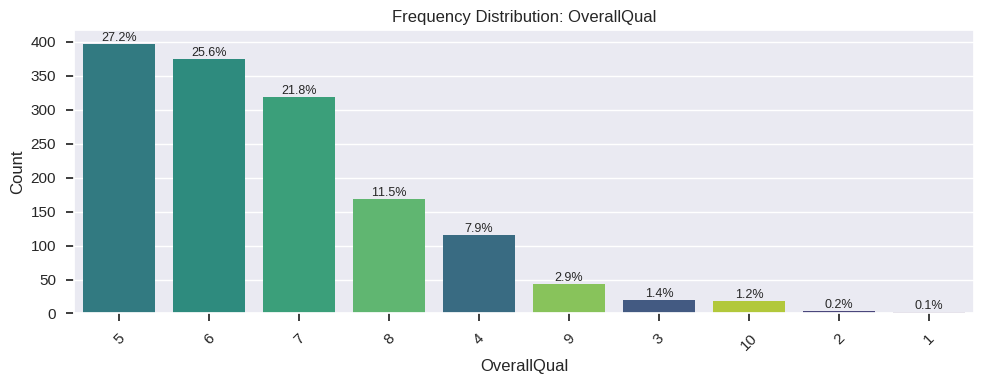

----------------------------------------

--- Categorical Analysis: OverallCond ---
Cardinality (unique): 9
Dominant category: 5 (56.2%)
Rare categories (<5%): [8, 4, 3, 9, 2, 1]


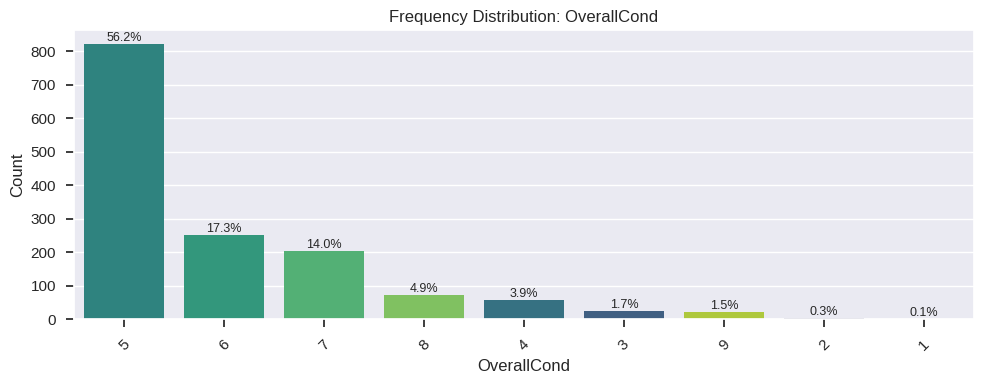

----------------------------------------



In [13]:
for col in num_cols:
    analyze_numerical(df, col)

for col in cat_cols:
    analyze_categorical(df, col)

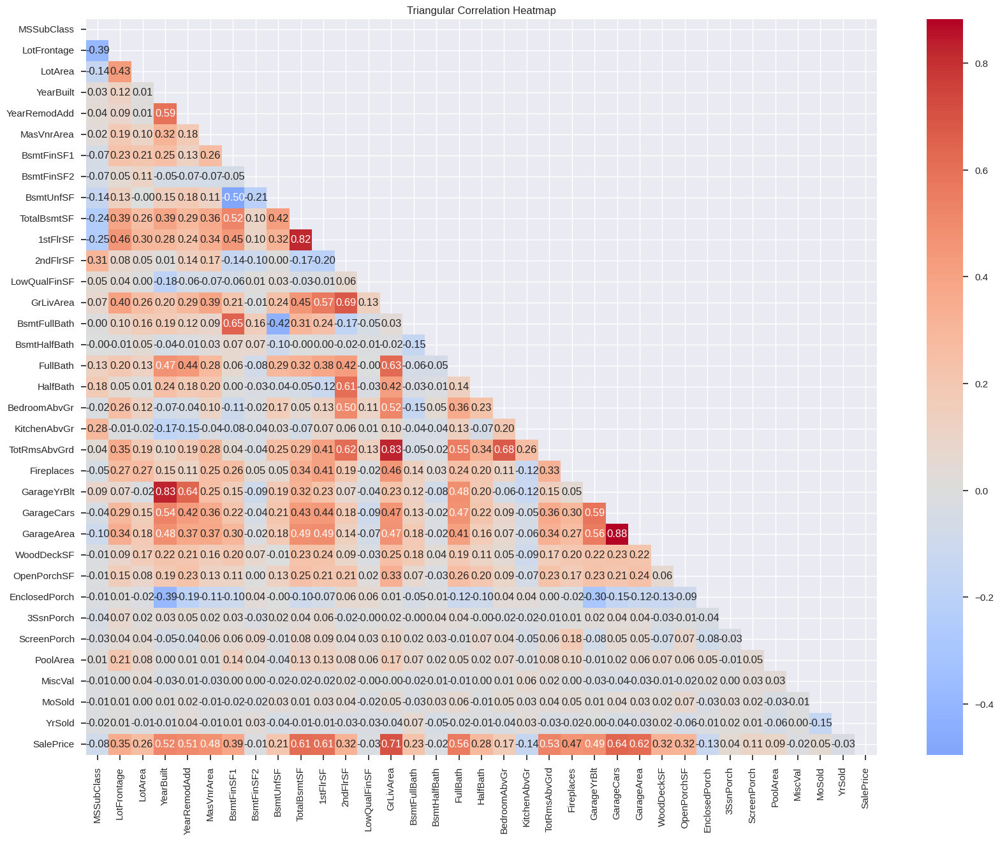

In [14]:
sns.pairplot(df, diag_kind='kde', corner=True, palette='viridis')
plt.show()

plt.figure(figsize=(20, 15))
mask = np.triu(np.ones_like(df.corr(numeric_only=True), dtype=bool))
sns.heatmap(df.corr(numeric_only=True), mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0)
plt.title("Triangular Correlation Heatmap")
plt.show()

In [15]:
num_cols = [col for col in num_cols if col != 'SalePrice']

In [16]:
Y = df['SalePrice']
X = df.drop(columns = ['SalePrice'])

In [17]:
pipe1 = ColumnTransformer([
    ('impute_LotFrontage', SimpleImputer(strategy='median'), ['LotFrontage']),
    ('impute_MasVnrArea', SimpleImputer(strategy='most_frequent'), ['MasVnrArea']),
    ('impute_GarageYrBlt', SimpleImputer(strategy='most_frequent'), ['GarageYrBlt']),
    ('impute_LotArea', SimpleImputer(strategy='median'), ['LotArea']),
    ('impute_YearBuilt', SimpleImputer(strategy='most_frequent'), ['YearBuilt']),
    ('impute_YearRemodAdd', SimpleImputer(strategy='most_frequent'), ['YearRemodAdd']),
    ('impute_BsmtFinSF1', SimpleImputer(strategy='median'), ['BsmtFinSF1']),
    ('impute_BsmtFinSF2', SimpleImputer(strategy='most_frequent'), ['BsmtFinSF2']),
    ('impute_BsmtUnfSF', SimpleImputer(strategy='median'), ['BsmtUnfSF']),
    ('impute_TotalBsmtSF', SimpleImputer(strategy='mean'), ['TotalBsmtSF']),
    ('impute_1stFlrSF', SimpleImputer(strategy='median'), ['1stFlrSF']),
    ('impute_2ndFlrSF', SimpleImputer(strategy='most_frequent'), ['2ndFlrSF']),
    ('impute_LowQualFinSF', SimpleImputer(strategy='most_frequent'), ['LowQualFinSF']),
    ('impute_GrLivArea', SimpleImputer(strategy='mean'), ['GrLivArea']),
    ('impute_BsmtFullBath', SimpleImputer(strategy='most_frequent'), ['BsmtFullBath']),
    ('impute_BsmtHalfBath', SimpleImputer(strategy='most_frequent'), ['BsmtHalfBath']),
    ('impute_FullBath', SimpleImputer(strategy='most_frequent'), ['FullBath']),
    ('impute_HalfBath', SimpleImputer(strategy='most_frequent'), ['HalfBath']),
    ('impute_BedroomAbvGr', SimpleImputer(strategy='most_frequent'), ['BedroomAbvGr']),
    ('impute_KitchenAbvGr', SimpleImputer(strategy='most_frequent'), ['KitchenAbvGr']),
    ('impute_TotRmsAbvGrd', SimpleImputer(strategy='most_frequent'), ['TotRmsAbvGrd']),
    ('impute_Fireplaces', SimpleImputer(strategy='most_frequent'), ['Fireplaces']),
    ('impute_GarageCars', SimpleImputer(strategy='most_frequent'), ['GarageCars']),
    ('impute_GarageArea', SimpleImputer(strategy='median'), ['GarageArea']),
    ('impute_WoodDeckSF', SimpleImputer(strategy='most_frequent'), ['WoodDeckSF']),
    ('impute_OpenPorchSF', SimpleImputer(strategy='most_frequent'), ['OpenPorchSF']),
    ('impute_EnclosedPorch', SimpleImputer(strategy='most_frequent'), ['EnclosedPorch']),
    ('impute_3SsnPorch', SimpleImputer(strategy='most_frequent'), ['3SsnPorch']),
    ('impute_ScreenPorch', SimpleImputer(strategy='most_frequent'), ['ScreenPorch']),
    ('impute_PoolArea', SimpleImputer(strategy='most_frequent'), ['PoolArea']),
    ('impute_MiscVal', SimpleImputer(strategy='most_frequent'), ['MiscVal']),
    ('impute_MoSold', SimpleImputer(strategy='most_frequent'), ['MoSold']),
    ('impute_YrSold', SimpleImputer(strategy='most_frequent'), ['YrSold']),
    ('impute_cat', SimpleImputer(strategy='most_frequent'), cat_cols)
], remainder='passthrough', verbose_feature_names_out=False)

pipe1.set_output(transform="pandas")

ColumnTransformer(remainder='passthrough',
                  transformers=[('impute_LotFrontage',
                                 SimpleImputer(strategy='median'),
                                 ['LotFrontage']),
                                ('impute_MasVnrArea',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['MasVnrArea']),
                                ('impute_GarageYrBlt',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['GarageYrBlt']),
                                ('impute_LotArea',
                                 SimpleImputer(strategy='median'),
                                 ['LotArea']),
                                ('...
                                 ['OpenPorchSF']),
                                ('impute_EnclosedPorch',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['EnclosedPorch']),
                                ('impute_3SsnPorch',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['3SsnPorch']),
                                ('impute_ScreenPorch',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['ScreenPorch']),
                                ('impute_PoolArea',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['PoolArea']), ...],
                  verbose_feature_names_out=False)

In [18]:
pipe2 = ColumnTransformer([
    ('onehot', OneHotEncoder(sparse_output=False), cat_cols),
    ('scaling', StandardScaler(), num_cols)
], remainder='passthrough', verbose_feature_names_out=False)

pipe2.set_output(transform="pandas")

ColumnTransformer(remainder='passthrough',
                  transformers=[('onehot', OneHotEncoder(sparse_output=False),
                                 ['MSZoning', 'Street', 'LotShape',
                                  'LandContour', 'Utilities', 'LotConfig',
                                  'LandSlope', 'Neighborhood', 'Condition1',
                                  'Condition2', 'BldgType', 'HouseStyle',
                                  'RoofStyle', 'RoofMatl', 'Exterior1st',
                                  'Exterior2nd', 'ExterQual', 'ExterCond',
                                  'Foundation', 'BsmtQual', 'Bs...
                                  'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2',
                                  'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
                                  '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
                                  'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
                                  'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
                                  'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
                                  'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
                                  'EnclosedPorch', '3SsnPorch', 'ScreenPorch', ...])],
                  verbose_feature_names_out=False)

In [50]:
model = MLPRegressor(
    hidden_layer_sizes=(250, 250, 500, 250, 50, 1), 
    max_iter=3000
)

In [51]:
pipe = Pipeline([
    ('missingValue', pipe1),
    ('pipe2', pipe2),
    ('regressor', model)
])

In [52]:
pipe.fit(X, Y)
pipe.score(X, Y)

-5.1885975265555215

In [ ]:
testdf = pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/test.csv")
testdf = testdf.drop(columns=drop_cols)

for col in cat_cols:
    testdf[col] = testdf[col].astype("category")
for col in num_cols:
    testdf[col] = testdf[col].astype("float64")

In [ ]:
pred = pipe.predict(testdf)

In [ ]:
testdata = pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/test.csv")
submission = pd.DataFrame({
    'Id': testdata['Id'],
    'SalePrice': pred
})

submission.sort_values(by='Id', ascending=True, inplace=True)

submission.to_csv('my_submission.csv', index=False)
print("Saved successfully to 'my_submission.csv'")